   Unnamed: 0       Date      Open      High       Low     Close    P/E   P/B  \
0        4975 2020-01-02  12198.55  12289.90  12195.25  12282.20  28.56  3.79   
1        4976 2020-01-03  12261.10  12265.60  12191.35  12226.65  28.44  3.77   
2        4977 2020-01-06  12170.60  12179.10  11974.20  11993.05  27.89  3.70   
3        4978 2020-01-07  12079.10  12152.15  12005.35  12052.95  28.03  3.72   
4        4979 2020-01-08  11939.10  12044.95  11929.60  12025.35  27.97  3.71   

  Div Yield %  
0        1.23  
1        1.23  
2        1.26  
3        1.25  
4        1.25  
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.0/75.0 kB 995.1 kB/s eta 0:00:00
Candlestick chart saved for 2020-01
Candlestick chart saved for 2020-02
Candlestick chart saved for 2020-03
Candlestick chart saved for 2020-04
Candlestick chart saved for 2020-05
Candlestick chart saved for 2020-06
Candlestick chart saved for 2020-07
Candlestick chart saved for 2020-08
Candlestick chart saved for 2020-09
Candlestick c

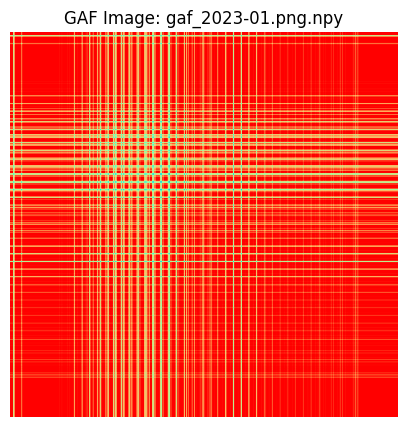

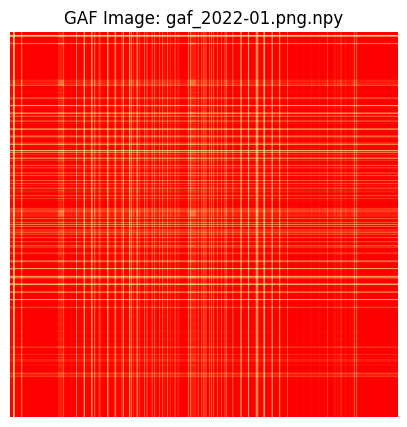

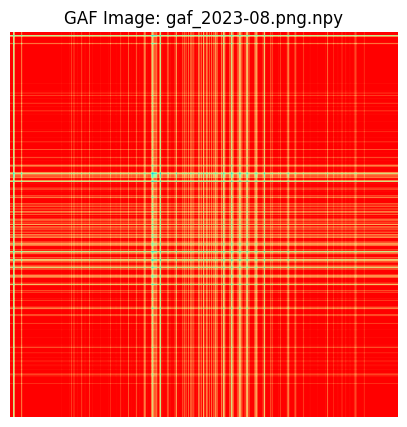

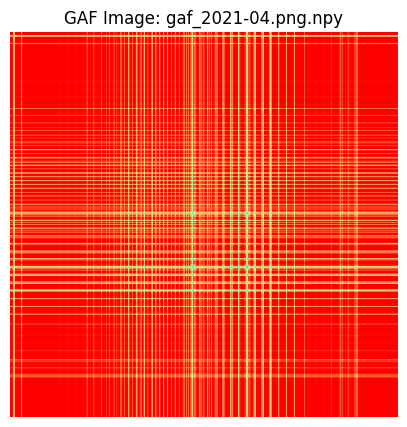

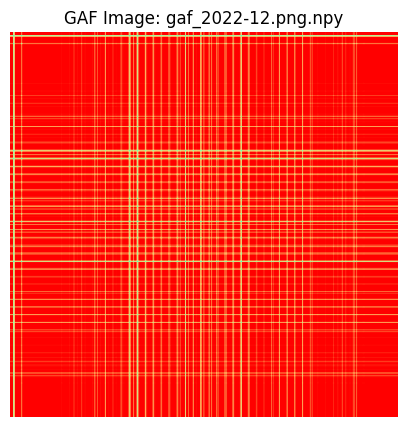

...

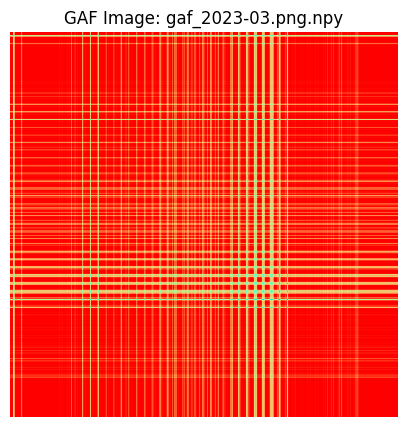

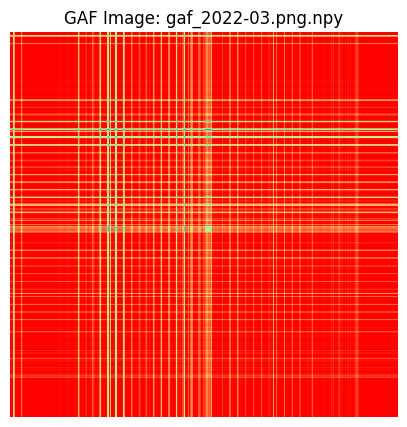

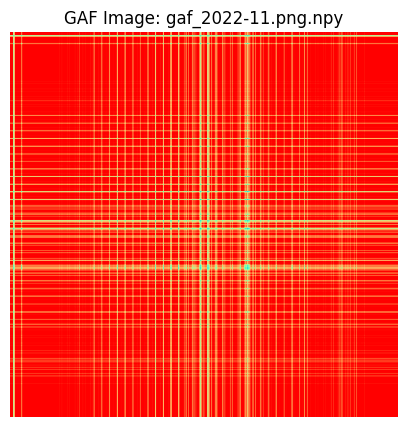

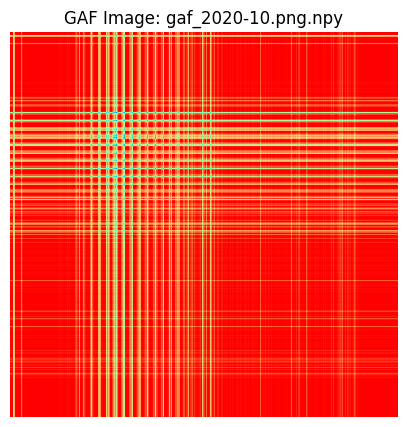

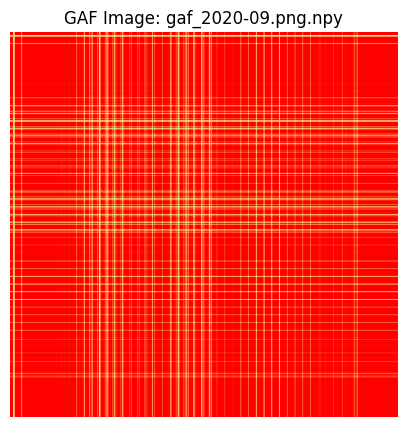

In [ ]:
import pandas as pd

# Load the dataset
df = pd.read_csv('/content/NIFTY_50_Data_After_2020.csv')

# Convert the Date column to datetime format
df['Date'] = pd.to_datetime(df['Date'])


# Sort the data by Date
df = df.sort_values(by='Date')

print(df.head())

!pip install mplfinance

import mplfinance as mpf
import os

# Create a directory to save candlestick charts
os.makedirs('candlestick_charts', exist_ok=True)

# Group data by month
df['YearMonth'] = df['Date'].dt.to_period('M')
monthly_groups = df.groupby('YearMonth')

# Generate candlestick charts for each month
for name, group in monthly_groups:
    # Set Date as index for mplfinance
    group.set_index('Date', inplace=True)

    # Generate and save the candlestick chart
    chart_name = f'candlestick_charts/candlestick_{name}.png'
    mpf.plot(group, type='candle', style='charles', title=str(name), savefig=chart_name)

    print(f'Candlestick chart saved for {name}')


!pip install pyts
import pyts
import cv2
import numpy as np
from pyts.image import GramianAngularField

# Create a directory to save GAF images
os.makedirs('gaf_images', exist_ok=True)

# Initialize GAF transformer
gaf = GramianAngularField(method='summation')

# Convert candlestick images to GAF
candlestick_images = os.listdir('candlestick_charts')

for image_name in candlestick_images:
    # Load the candlestick image
    img = cv2.imread(f'candlestick_charts/{image_name}', cv2.IMREAD_GRAYSCALE)

    # Resize image if necessary
    img_resized = cv2.resize(img, (50, 50))  # resizing to 50x50 for GAF

    # Normalize the image to [0, 1] range
    img_normalized = img_resized / 255.0

    # Reshape the image to a 1D array for GAF (50*50, )
    img_flattened = img_normalized.flatten().reshape(1, -1)  # (1, 2500)

    # Apply GAF transformation
    gaf_img = gaf.fit_transform(img_flattened)  # GAF expects a 2D array (n_samples, n_features)

    # Since the output of GAF is 3D, we can take the first element
    gaf_img = gaf_img[0]  # Get the first GAF image

    # Save the GAF image as a NumPy array
    gaf_image_name = f'gaf_images/gaf_{image_name.split("_")[1]}.npy'  # saving as .npy for numpy array
    np.save(gaf_image_name, gaf_img)

    print(f'GAF image saved for {image_name}')


import os
import numpy as np
import matplotlib.pyplot as plt

# Directory where GAF images are saved
gaf_images_dir = 'gaf_images'

# List all GAF image files in the directory
gaf_images = os.listdir(gaf_images_dir)

# Create a function to load and display GAF images
def load_and_display_gaf_images(gaf_images_dir, gaf_images):
    for image_name in gaf_images:
        # Load the GAF image
        gaf_image_path = os.path.join(gaf_images_dir, image_name)
        gaf_img = np.load(gaf_image_path)

        # Display the GAF image
        plt.figure(figsize=(5, 5))
        plt.imshow(gaf_img, cmap='rainbow', aspect='auto')
        plt.title(f'GAF Image: {image_name}')
        plt.axis('off')  # Hide axes
        plt.show()

# Load and display GAF images
load_and_display_gaf_images(gaf_images_dir, gaf_images)



In [ ]:
import pandas as pd

# Load the dataset
df = pd.read_csv('/content/NIFTY_50_Data_After_2020.csv')

# Convert the Date column to datetime format
df['Date'] = pd.to_datetime(df['Date'])

# Sort the data by Date
df = df.sort_values(by='Date').reset_index(drop=True)

# Function to detect Morning Star and Evening Star patterns
def detect_patterns(data):
    morning_star_indices = []
    evening_star_indices = []
    for i in range(2, len(data) - 1):
        # Morning Star pattern
        if (data['Close'].iloc[i - 2] > data['Open'].iloc[i - 2] and  # First candle is bearish
            data['Close'].iloc[i - 1] < data['Open'].iloc[i - 1] and  # Second candle is bearish
            data['Close'].iloc[i] > data['Open'].iloc[i] and  # Third candle is bullish
            data['Close'].iloc[i] < data['Close'].iloc[i - 2] and  # Third candle closes above the first
            data['Close'].iloc[i - 1] < data['Close'].iloc[i - 2]):  # Second candle closes below the first
            morning_star_indices.append(i)

        # Evening Star pattern
        elif (data['Close'].iloc[i - 2] < data['Open'].iloc[i - 2] and  # First candle is bullish
              data['Close'].iloc[i - 1] > data['Open'].iloc[i - 1] and  # Second candle is bullish
              data['Close'].iloc[i] < data['Open'].iloc[i] and  # Third candle is bearish
              data['Close'].iloc[i] > data['Close'].iloc[i - 2] and  # Third candle closes below the first
              data['Close'].iloc[i - 1] > data['Close'].iloc[i - 2]):  # Second candle closes above the first
            evening_star_indices.append(i)

    return morning_star_indices, evening_star_indices

# Detect patterns
morning_star_indices, evening_star_indices = detect_patterns(df)

# Initialize labels
df['MorningStar'] = 0
df['EveningStar'] = 0

# Assign labels
df.loc[morning_star_indices, 'MorningStar'] = 1
df.loc[evening_star_indices, 'EveningStar'] = 1

# Aggregate labels per month
df['YearMonth'] = df['Date'].dt.to_period('M')
monthly_labels = df.groupby('YearMonth').agg({'MorningStar': 'max', 'EveningStar': 'max'}).reset_index()

# Map YearMonth to GAF image filenames
monthly_labels['filename'] = monthly_labels['YearMonth'].astype(str).apply(lambda x: f'gaf_{x}.png.npy')

# Save labels to CSV
monthly_labels.to_csv('monthly_labels.csv', index=False)

print(monthly_labels.head())
#sCREENSHOT CUSTOM DATASET

  YearMonth  MorningStar  EveningStar             filename
0   2020-01            1            0  gaf_2020-01.png.npy
1   2020-02            0            1  gaf_2020-02.png.npy
2   2020-03            1            1  gaf_2020-03.png.npy
3   2020-04            1            1  gaf_2020-04.png.npy
4   2020-05            0            0  gaf_2020-05.png.npy


In [ ]:
# Load the labels
labels_df = pd.read_csv('monthly_labels.csv')

# Check the distribution of classes
print(labels_df[['MorningStar', 'EveningStar']].sum())
#SS ANALYSIS

MorningStar    30
EveningStar    37
dtype: int64


In [ ]:


from sklearn.model_selection import train_test_split
# Separate positive instances for both classes
morning_star_positive = labels_df[labels_df['MorningStar'] == 1]
evening_star_positive = labels_df[labels_df['EveningStar'] == 1]

# Remaining data
remaining_df = labels_df[(labels_df['MorningStar'] == 0) & (labels_df['EveningStar'] == 0)]

# Manually split positive instances into train, val, and test
morning_star_train, morning_star_test = train_test_split(morning_star_positive, test_size=2, random_state=42)
morning_star_train, morning_star_val = train_test_split(morning_star_train, test_size=1, random_state=42)

evening_star_train, evening_star_test = train_test_split(evening_star_positive, test_size=2, random_state=42)
evening_star_train, evening_star_val = train_test_split(evening_star_train, test_size=1, random_state=42)

# Combine with remaining data
train_df = pd.concat([morning_star_train, evening_star_train, remaining_df])
val_df = pd.concat([morning_star_val, evening_star_val])
test_df = pd.concat([morning_star_test, evening_star_test])

# Save split labels
train_df.to_csv('train_labels.csv', index=False)
val_df.to_csv('val_labels.csv', index=False)
test_df.to_csv('test_labels.csv', index=False)

print(f"Training set: {len(train_df)} samples")
print(f"Validation set: {len(val_df)} samples")
print(f"Test set: {len(test_df)} samples")


"""
# Stratified split to ensure class balance
train_df, test_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df[['MorningStar', 'EveningStar']], random_state=42)
train_df, val_df = train_test_split(train_df, test_size=0.2, stratify=train_df[['MorningStar', 'EveningStar']], random_state=42)

# Save split labels
train_df.to_csv('train_labels.csv', index=False)
val_df.to_csv('val_labels.csv', index=False)
test_df.to_csv('test_labels.csv', index=False)

print(f"Training set: {len(train_df)} samples")
print(f"Validation set: {len(val_df)} samples")
print(f"Test set: {len(test_df)} samples")
"""

Training set: 67 samples
Validation set: 2 samples
Test set: 4 samples


'\n# Stratified split to ensure class balance\ntrain_df, test_df = train_test_split(labels_df, test_size=0.2, stratify=labels_df[[\'MorningStar\', \'EveningStar\']], random_state=42)\ntrain_df, val_df = train_test_split(train_df, test_size=0.2, stratify=train_df[[\'MorningStar\', \'EveningStar\']], random_state=42)\n\n# Save split labels\ntrain_df.to_csv(\'train_labels.csv\', index=False)\nval_df.to_csv(\'val_labels.csv\', index=False)\ntest_df.to_csv(\'test_labels.csv\', index=False)\n\nprint(f"Training set: {len(train_df)} samples")\nprint(f"Validation set: {len(val_df)} samples")\nprint(f"Test set: {len(test_df)} samples")\n'

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
import numpy as np
from PIL import Image
import pandas as pd
import os
from torchvision import transforms

class GAFDataset(Dataset):
    def __init__(self, labels_csv, gaf_dir, transform=None):
        self.labels = pd.read_csv(labels_csv)
        self.gaf_dir = gaf_dir
        self.transform = transform

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        row = self.labels.iloc[idx]
        filename = row['filename']
        gaf_path = os.path.join(self.gaf_dir, filename)
        gaf_image = np.load(gaf_path)

        # Normalize GAF image to [0, 255]
        gaf_image = (gaf_image - gaf_image.min()) / (gaf_image.max() - gaf_image.min())
        gaf_image = (gaf_image * 255).astype(np.uint8)

        # Convert to PIL Image
        gaf_pil = Image.fromarray(gaf_image)

        # Apply transformations
        if self.transform:
            gaf_pil = self.transform(gaf_pil)

        # Extract labels
        labels = np.array([row['MorningStar'], row['EveningStar']]).astype(np.float32)

        return gaf_pil, labels

# Define transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Grayscale(num_output_channels=3),  # Convert to 3 channels
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],  # ImageNet mean
                         [0.229, 0.224, 0.225])  # ImageNet std
])

# Create datasets
train_dataset = GAFDataset('train_labels.csv', 'gaf_images', transform=transform)
val_dataset = GAFDataset('val_labels.csv', 'gaf_images', transform=transform)
test_dataset = GAFDataset('test_labels.csv', 'gaf_images', transform=transform)

# Create dataloaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=4)


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


resnet Starts

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models

# Set device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load pre-trained ResNet18
model = models.resnet18(pretrained=True)

# Modify the final fully connected layer
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 2)  # Two output classes: MorningStar and EveningStar

# Move model to device
model = model.to(device)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 135MB/s]


In [ ]:
# Define loss function
criterion = nn.BCEWithLogitsLoss()

# Define optimizer
optimizer = optim.Adam(model.parameters(), lr=1e-4)


In [ ]:
import time
from torch.optim import lr_scheduler

# Optionally, define a learning rate scheduler
scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

num_epochs = 10
best_val_loss = float('inf')
best_model_wts = None

for epoch in range(num_epochs):
    print(f'Epoch {epoch+1}/{num_epochs}')
    print('-' * 10)

    # Each epoch has a training and validation phase
    for phase in ['train', 'val']:
        if phase == 'train':
            model.train()  # Set model to training mode
            dataloader = train_loader
        else:
            model.eval()   # Set model to evaluate mode
            dataloader = val_loader

        running_loss = 0.0
        running_corrects = 0
        total = 0

        # Iterate over data
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Zero the parameter gradients
            optimizer.zero_grad()

            # Forward pass
            with torch.set_grad_enabled(phase == 'train'):
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                preds = torch.sigmoid(outputs) > 0.5  # Binary predictions

                # Backward pass and optimize only if in training phase
                if phase == 'train':
                    loss.backward()
                    optimizer.step()

            # Statistics
            running_loss += loss.item() * inputs.size(0)
            running_corrects += (preds.float() == labels).sum().item()
            total += labels.size(0) * labels.size(1)

        epoch_loss = running_loss / (len(train_dataset) if phase == 'train' else len(val_dataset))
        epoch_acc = running_corrects / total

        print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

        # Deep copy the model
        if phase == 'val' and epoch_loss < best_val_loss:
            best_val_loss = epoch_loss
            best_model_wts = model.state_dict()

    # Step the scheduler
    scheduler.step()
    print()

# Load best model weights
if best_model_wts:
    model.load_state_dict(best_model_wts)


Epoch 1/10
----------


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


train Loss: 0.0392 Acc: 1.0000
val Loss: 0.4570 Acc: 0.7500

Epoch 2/10
----------
train Loss: 0.0671 Acc: 1.0000
val Loss: 0.4767 Acc: 0.7500

Epoch 3/10
----------
train Loss: 0.0464 Acc: 1.0000
val Loss: 0.4954 Acc: 0.7500

Epoch 4/10
----------
train Loss: 0.0344 Acc: 1.0000
val Loss: 0.4983 Acc: 0.7500

Epoch 5/10
----------
train Loss: 0.0449 Acc: 1.0000
val Loss: 0.5133 Acc: 0.7500

Epoch 6/10
----------
train Loss: 0.0524 Acc: 1.0000
val Loss: 0.5238 Acc: 0.7500

Epoch 7/10
----------
train Loss: 0.0330 Acc: 1.0000
val Loss: 0.4928 Acc: 0.7500

Epoch 8/10
----------
train Loss: 0.0511 Acc: 1.0000
val Loss: 0.4845 Acc: 0.7500

Epoch 9/10
----------
train Loss: 0.0523 Acc: 1.0000
val Loss: 0.5898 Acc: 0.7500

Epoch 10/10
----------
train Loss: 0.0379 Acc: 1.0000
val Loss: 0.6060 Acc: 0.7500



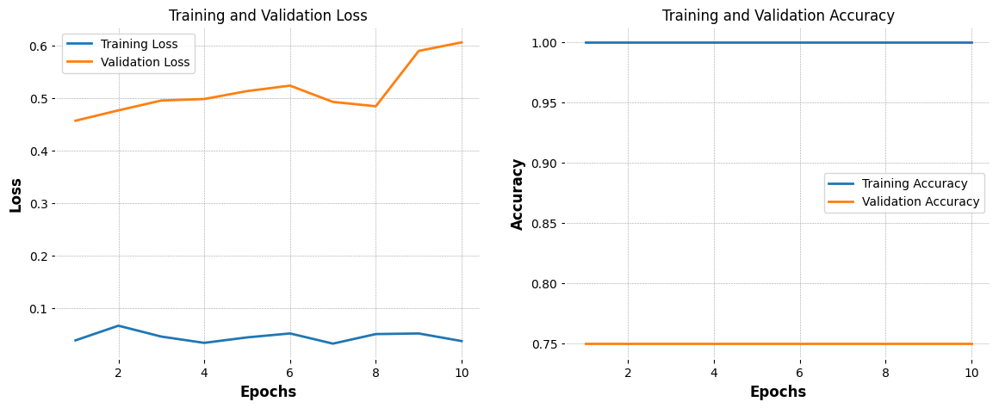

In [ ]:
import time
import torch
import matplotlib.pyplot as plt
from torch.optim import lr_scheduler

# Optionally, define a learning rate scheduler
scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

num_epochs = 10
best_val_loss = float('inf')
best_model_wts = None

# Lists to track losses and accuracies
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

for epoch in range(num_epochs):
    print(f'Epoch {epoch+1}/{num_epochs}')
    print('-' * 10)

    # Each epoch has a training and validation phase
    for phase in ['train', 'val']:
        if phase == 'train':
            model.train()  # Set model to training mode
            dataloader = train_loader
        else:
            model.eval()   # Set model to evaluate mode
            dataloader = val_loader

        running_loss = 0.0
        running_corrects = 0
        total = 0

        # Iterate over data
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Zero the parameter gradients
            optimizer.zero_grad()

            # Forward pass
            with torch.set_grad_enabled(phase == 'train'):
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                preds = torch.sigmoid(outputs) > 0.5  # Binary predictions

                # Backward pass and optimize only if in training phase
                if phase == 'train':
                    loss.backward()
                    optimizer.step()

            # Statistics
            running_loss += loss.item() * inputs.size(0)
            running_corrects += (preds.float() == labels).sum().item()
            total += labels.size(0) * labels.size(1)

        epoch_loss = running_loss / (len(train_dataset) if phase == 'train' else len(val_dataset))
        epoch_acc = running_corrects / total

        if phase == 'train':
            train_losses.append(epoch_loss)
            train_accuracies.append(epoch_acc)
        else:
            val_losses.append(epoch_loss)
            val_accuracies.append(epoch_acc)

        print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

        # Deep copy the model
        if phase == 'val' and epoch_loss < best_val_loss:
            best_val_loss = epoch_loss
            best_model_wts = model.state_dict()

    # Step the scheduler
    scheduler.step()
    print()

# Load best model weights
if best_model_wts:
    model.load_state_dict(best_model_wts)

# Plotting Loss and Accuracy Graphs
epochs_range = range(1, num_epochs + 1)

plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_losses, label='Training Loss')
plt.plot(epochs_range, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs_range, train_accuracies, label='Training Accuracy')
plt.plot(epochs_range, val_accuracies, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.show()


Resnet End

In [ ]:
Start CNN

Epoch 1/10
----------


/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


train Loss: 0.7492 Acc: 0.6493
val Loss: 0.6706 Acc: 0.7500
Epoch 2/10
----------
train Loss: 0.5929 Acc: 0.7463
val Loss: 0.7655 Acc: 0.2500
Epoch 3/10
----------
train Loss: 0.7154 Acc: 0.7164
val Loss: 0.5334 Acc: 0.7500
Epoch 4/10
----------
train Loss: 0.5360 Acc: 0.7687
val Loss: 0.8294 Acc: 0.2500
Epoch 5/10
----------
train Loss: 0.6136 Acc: 0.7164
val Loss: 0.6684 Acc: 0.7500
Epoch 6/10
----------
train Loss: 0.5882 Acc: 0.7687
val Loss: 0.7302 Acc: 0.7500
Epoch 7/10
----------
train Loss: 0.5057 Acc: 0.7612
val Loss: 0.7144 Acc: 0.7500
Epoch 8/10
----------
train Loss: 0.6610 Acc: 0.7836
val Loss: 0.6894 Acc: 0.7500
Epoch 9/10
----------
train Loss: 0.5180 Acc: 0.7985
val Loss: 0.6024 Acc: 0.7500
Epoch 10/10
----------
train Loss: 0.4481 Acc: 0.7985
val Loss: 0.5719 Acc: 0.7500


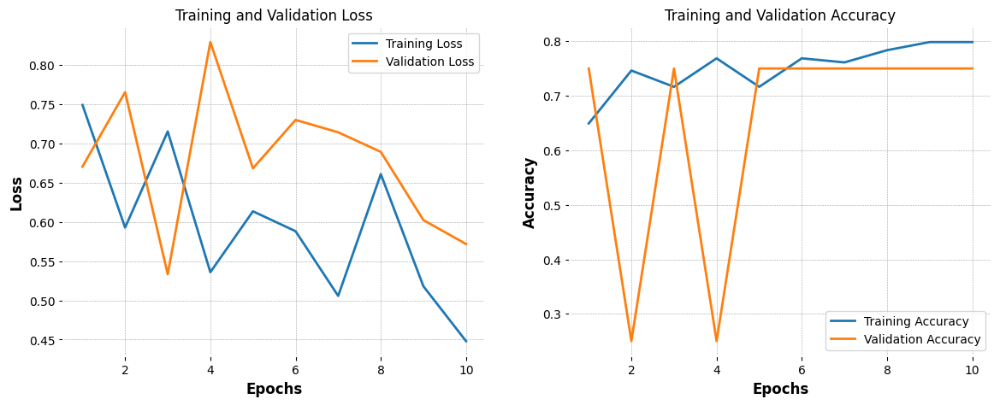

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torchvision.transforms as transforms

# Simplified model with batch normalization and increased dropout
class EnhancedCNN(nn.Module):
    def __init__(self):
        super(EnhancedCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 16, kernel_size=3, stride=2, padding=1)
        self.bn1 = nn.BatchNorm2d(16)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1)
        self.bn2 = nn.BatchNorm2d(32)
        self.conv3 = nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1)
        self.bn3 = nn.BatchNorm2d(64)
        self.fc1 = nn.Linear(64 * 28 * 28, 128)
        self.dropout = nn.Dropout(0.6)  # Increased dropout rate
        self.fc2 = nn.Linear(128, 2)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.bn1(self.conv1(x)))
        x = self.relu(self.bn2(self.conv2(x)))
        x = self.relu(self.bn3(self.conv3(x)))
        x = x.view(-1, 64 * 28 * 28)
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x

model = EnhancedCNN().to(device)

# Adjust optimizer and learning rate scheduler
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-4)
scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3, verbose=True)

# Criterion
criterion = nn.BCEWithLogitsLoss()

# Training Loop
num_epochs = 10
best_val_loss = float('inf')
best_model_wts = None

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

for epoch in range(num_epochs):
    print(f'Epoch {epoch+1}/{num_epochs}')
    print('-' * 10)

    for phase in ['train', 'val']:
        if phase == 'train':
            model.train()
            dataloader = train_loader
        else:
            model.eval()
            dataloader = val_loader

        running_loss = 0.0
        running_corrects = 0
        total = 0

        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()

            with torch.set_grad_enabled(phase == 'train'):
                outputs = model(inputs)
                loss = criterion(outputs, labels.float())
                preds = torch.sigmoid(outputs) > 0.5

                if phase == 'train':
                    loss.backward()
                    optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            running_corrects += (preds.float() == labels).sum().item()
            total += labels.size(0) * labels.size(1)

        epoch_loss = running_loss / (len(train_dataset) if phase == 'train' else len(val_dataset))
        epoch_acc = running_corrects / total

        if phase == 'train':
            train_losses.append(epoch_loss)
            train_accuracies.append(epoch_acc)
        else:
            val_losses.append(epoch_loss)
            val_accuracies.append(epoch_acc)
            scheduler.step(epoch_loss)  # Use validation loss for LR scheduling

        print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

        if phase == 'val' and epoch_loss < best_val_loss:
            best_val_loss = epoch_loss
            best_model_wts = model.state_dict()

if best_model_wts:
    model.load_state_dict(best_model_wts)

# Plotting Loss and Accuracy Graphs
epochs_range = range(1, num_epochs + 1)

plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_losses, label='Training Loss')
plt.plot(epochs_range, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs_range, train_accuracies, label='Training Accuracy')
plt.plot(epochs_range, val_accuracies, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.show()


In [ ]:
from sklearn.metrics import classification_report

model.eval()  # Set model to evaluation mode
all_labels = []
all_preds = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)
        outputs = model(inputs)
        preds = torch.sigmoid(outputs) > 0.5  # Apply sigmoid and threshold
        all_labels.append(labels.cpu().numpy())
        all_preds.append(preds.cpu().numpy())

# Concatenate all batches
all_labels = np.vstack(all_labels)
all_preds = np.vstack(all_preds)

# Generate classification report
print(classification_report(all_labels, all_preds, target_names=['MorningStar', 'EveningStar']))


              precision    recall  f1-score   support

 MorningStar       1.00      1.00      1.00         4
 EveningStar       0.75      1.00      0.86         3

   micro avg       0.88      1.00      0.93         7
   macro avg       0.88      1.00      0.93         7
weighted avg       0.89      1.00      0.94         7
 samples avg       0.88      1.00      0.92         7



In [ ]:
def predict_patterns(model, gaf_path, transform, device, threshold=0.5):
    model.eval()
    gaf_image = np.load(gaf_path)
    gaf_image = (gaf_image - gaf_image.min()) / (gaf_image.max() - gaf_image.min())
    gaf_image = (gaf_image * 255).astype(np.uint8)
    gaf_pil = Image.fromarray(gaf_image)

    if transform:
        gaf_pil = transform(gaf_pil)

    gaf_pil = gaf_pil.unsqueeze(0).to(device)  # Add batch dimension

    with torch.no_grad():
        output = model(gaf_pil)
        probs = torch.sigmoid(output)
        preds = probs > threshold
        return preds.cpu().numpy()[0], probs.cpu().numpy()[0]

# Example usage
new_gaf_path = 'gaf_images/gaf_2024-01.png.npy'
preds, probs = predict_patterns(model, new_gaf_path, transform, device)
print(f"Morning Star: {preds[0]} (Probability: {probs[0]:.2f})")
print(f"Evening Star: {preds[1]} (Probability: {probs[1]:.2f})")


Morning Star: True (Probability: 0.94)
Evening Star: False (Probability: 0.00)


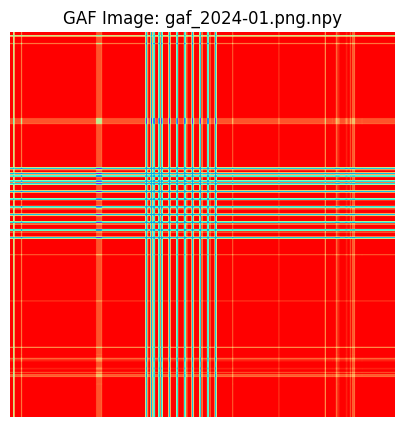

Detected Pattern: Bullish


In [ ]:
import matplotlib.pyplot as plt

def predict_patterns_and_display(model, gaf_path, transform, device):
    model.eval()
    gaf_image = np.load(gaf_path)

    # Normalize the GAF image
    gaf_image_normalized = (gaf_image - gaf_image.min()) / (gaf_image.max() - gaf_image.min())
    gaf_image_normalized = (gaf_image_normalized * 255).astype(np.uint8)

    # Convert to PIL Image
    gaf_pil = Image.fromarray(gaf_image_normalized)

    # Apply transformations
    if transform:
        gaf_pil_transformed = transform(gaf_pil).unsqueeze(0).to(device)

    # Perform prediction
    with torch.no_grad():
        output = model(gaf_pil_transformed)
        preds = torch.sigmoid(output) > 0.5  # Convert logits to binary predictions

    # Display the image
    plt.figure(figsize=(5, 5))
    plt.imshow(gaf_pil, cmap='rainbow')
    plt.title(f"GAF Image: {gaf_path.split('/')[-1]}")
    plt.axis('off')
    plt.show()

    # Determine if it's bullish or bearish
    morning_star, evening_star = preds.cpu().numpy()[0]

    if morning_star and not evening_star:
        print("Detected Pattern: Bullish")
    elif evening_star and not morning_star:
        print("Detected Pattern: Bearish")
    elif morning_star and evening_star:
        print("Detected Patterns: Both (Bullish) and (Bearish)")
    else:
        print("No significant pattern detected.")

# Example usage
new_gaf_path = 'gaf_images/gaf_2024-01.png.npy'
predict_patterns_and_display(model, new_gaf_path, transform, device)


In [ ]:

import torch
import torch.nn as nn

class SimpleCNN_NoMaxPool(nn.Module):
    def __init__(self):
        super(SimpleCNN_NoMaxPool, self).__init__()
        self.conv1 = nn.Conv2d(3, 16, kernel_size=3, stride=2, padding=1)  # Stride of 2 to downsample
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1) # Stride of 2 to downsample
        self.conv3 = nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1) # Stride of 2 to downsample
        # Adjusted the input size of the fully connected layer based on the new output size
        self.fc1 = nn.Linear(64 * 28 * 28, 128)
        self.fc2 = nn.Linear(128, 2)
        self.dropout = nn.Dropout(0.5)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        x = self.relu(self.conv3(x))
        x = x.view(-1, 64 * 28 * 28)
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x


In [ ]:
!pip install torchsummary


In [ ]:
from torchsummary import summary

summary(model, input_size=(3, 224, 224))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]          36,864
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
       BasicBlock-11           [-1, 64, 56, 56]               0
           Conv2d-12           [-1, 64, 56, 56]          36,864
      BatchNorm2d-13           [-1, 64, 56, 56]             128
             ReLU-14           [-1, 64,

In [ ]:
!pip install torchviz



  Preparing metadata (setup.py) ... done
  Created wheel for torchviz: filename=torchviz-0.0.2-py3-none-any.whl size=4132 sha256=6e89ddfaece678881456bba1a841383a6bdf5b6b0cfb0b1e9f210d5f2e8a1fc1
  Stored in directory: /root/.cache/pip/wheels/4c/97/88/a02973217949e0db0c9f4346d154085f4725f99c4f15a87094
Successfully built torchviz


In [ ]:
import pandas as pd

# Load the dataset
df = pd.read_csv('/content/NIFTY_50_Data_After_2020.csv')

# Convert the Date column to datetime format
df['Date'] = pd.to_datetime(df['Date'])

# Sort the data by Date
df = df.sort_values(by='Date').reset_index(drop=True)

# Function to detect Morning Star and Evening Star patterns
def detect_patterns(data):
    morning_star_indices = []
    evening_star_indices = []
    for i in range(2, len(data) - 1):
        # Morning Star pattern
        if (data['Close'].iloc[i - 2] > data['Open'].iloc[i - 2] and  # First candle is bearish
            data['Close'].iloc[i - 1] < data['Open'].iloc[i - 1] and  # Second candle is bearish
            data['Close'].iloc[i] > data['Open'].iloc[i] and  # Third candle is bullish
            data['Close'].iloc[i] < data['Close'].iloc[i - 2] and  # Third candle closes above the first
            data['Close'].iloc[i - 1] < data['Close'].iloc[i - 2]):  # Second candle closes below the first
            morning_star_indices.append(i)

        # Evening Star pattern
        elif (data['Close'].iloc[i - 2] < data['Open'].iloc[i - 2] and  # First candle is bullish
              data['Close'].iloc[i - 1] > data['Open'].iloc[i - 1] and  # Second candle is bullish
              data['Close'].iloc[i] < data['Open'].iloc[i] and  # Third candle is bearish
              data['Close'].iloc[i] > data['Close'].iloc[i - 2] and  # Third candle closes below the first
              data['Close'].iloc[i - 1] > data['Close'].iloc[i - 2]):  # Second candle closes above the first
            evening_star_indices.append(i)

    return morning_star_indices, evening_star_indices

# Detect patterns
morning_star_indices, evening_star_indices = detect_patterns(df)

# Initialize labels
df['MorningStar'] = 0
df['EveningStar'] = 0

# Assign labels
df.loc[morning_star_indices, 'MorningStar'] = 1
df.loc[evening_star_indices, 'EveningStar'] = 1

# Aggregate labels per month
df['YearMonth'] = df['Date'].dt.to_period('M')
monthly_labels1 = df.groupby('YearMonth').agg({'MorningStar': 'max', 'EveningStar': 'max'}).reset_index()

# Map YearMonth to GAF image filenames
monthly_labels1['filename'] = monthly_labels1['YearMonth'].astype(str).apply(lambda x: f'gaf_{x}.png.npy')

# Add the prediction column based on the comparison of MorningStar and EveningStar
def predict_trend(row):
    if row['MorningStar'] > row['EveningStar']:
        return 'Bullish'
    elif row['EveningStar'] > row['MorningStar']:
        return 'Bearish'
    else:
        return 'Bullish'  # If they are equal

# Apply the function to create the Prediction column
monthly_labels1['Prediction'] = monthly_labels.apply(predict_trend, axis=1)

# Save labels to CSV
monthly_labels1.to_csv('monthly_labels1.csv', index=False)

print(monthly_labels1.head())


  YearMonth  MorningStar  EveningStar             filename Prediction
0   2020-01            1            0  gaf_2020-01.png.npy    Bullish
1   2020-02            0            1  gaf_2020-02.png.npy    Bearish
2   2020-03            1            1  gaf_2020-03.png.npy    Bullish
3   2020-04            1            1  gaf_2020-04.png.npy    Bullish
4   2020-05            0            0  gaf_2020-05.png.npy    Bullish


Testing gaf_images/gaf_2020-01.png.npy...


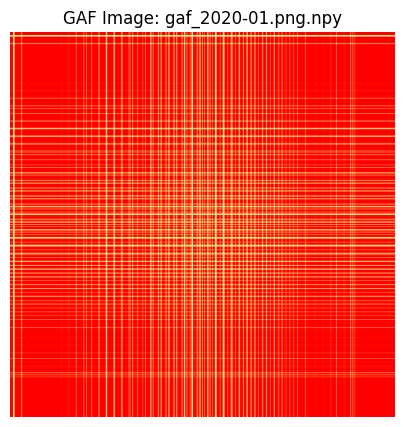

DETECTED PATTERN: Bullish
ACTUAL: Bullish (MorningStar: 1, EveningStar: 0)


Testing gaf_images/gaf_2020-02.png.npy...


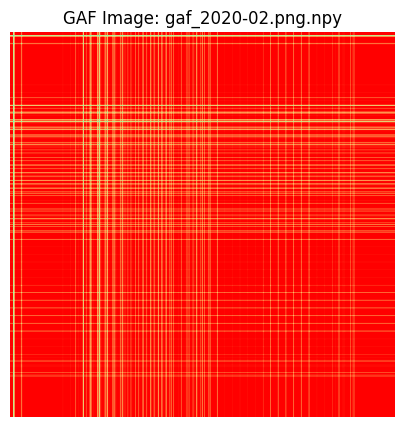

DETECTED PATTERN: Bearish
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2020-03.png.npy...


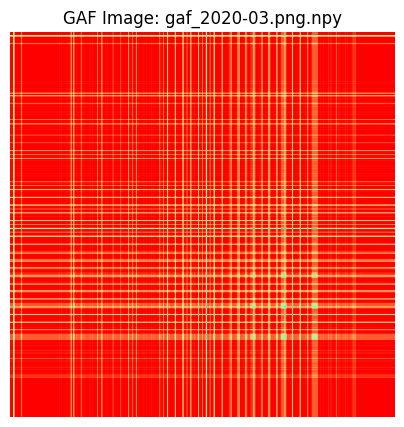

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2020-04.png.npy...


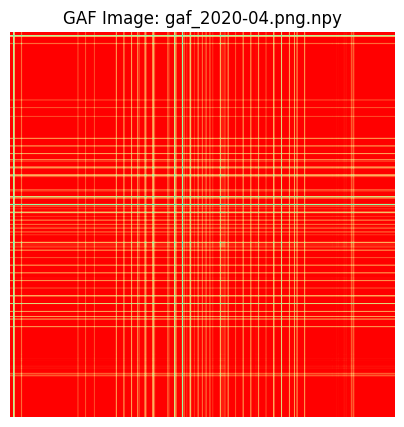

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2020-05.png.npy...


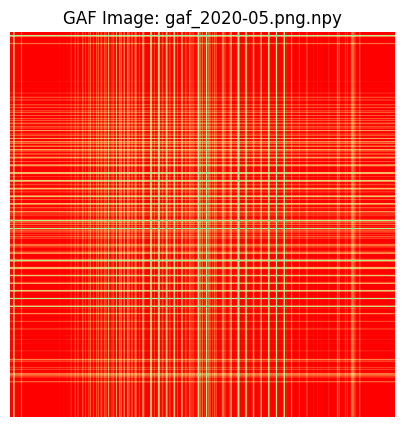

DETECTED PATTERN: No significant pattern detected.
ACTUAL: Bullish (MorningStar: 0, EveningStar: 0)


Testing gaf_images/gaf_2020-06.png.npy...


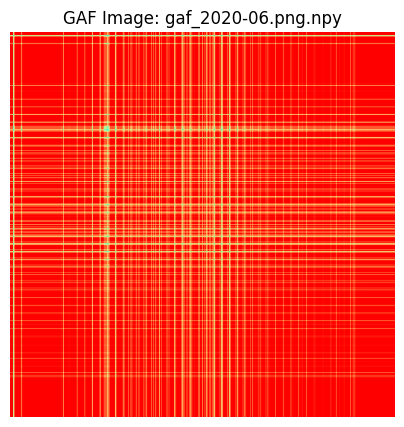

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2020-07.png.npy...


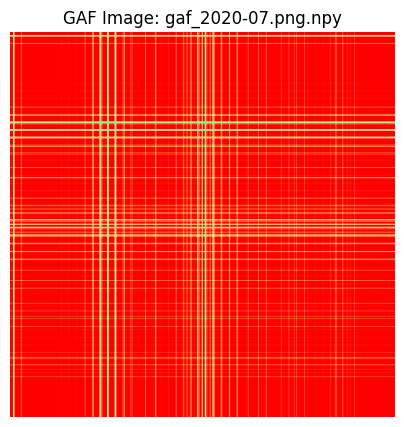

DETECTED PATTERN: Bearish
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2020-08.png.npy...


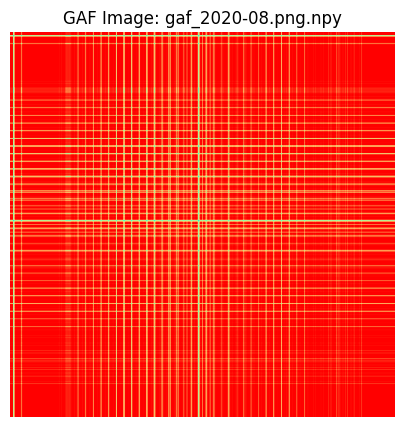

DETECTED PATTERN: Bearish
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2020-09.png.npy...


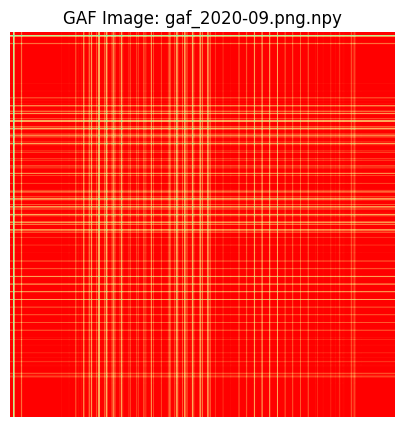

DETECTED PATTERN: Bullish
ACTUAL: Bullish (MorningStar: 1, EveningStar: 0)


Testing gaf_images/gaf_2020-10.png.npy...


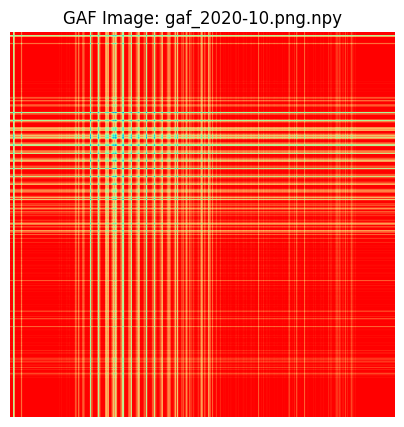

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2020-11.png.npy...


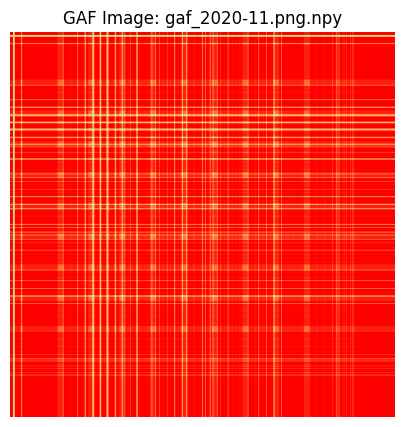

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2020-12.png.npy...


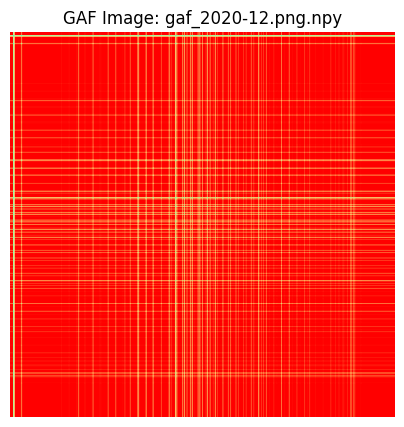

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2021-01.png.npy...


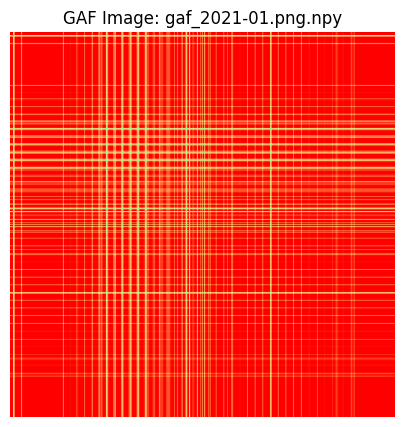

DETECTED PATTERN: No significant pattern detected.
ACTUAL: Bullish (MorningStar: 0, EveningStar: 0)


Testing gaf_images/gaf_2021-02.png.npy...


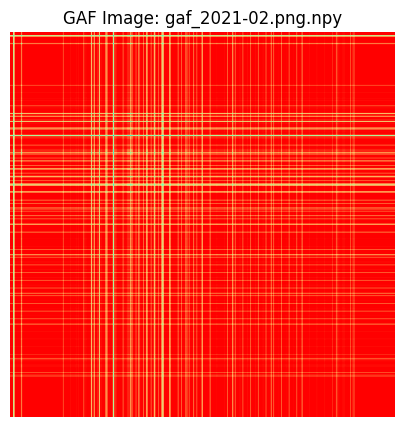

DETECTED PATTERN: Bearish
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2021-03.png.npy...


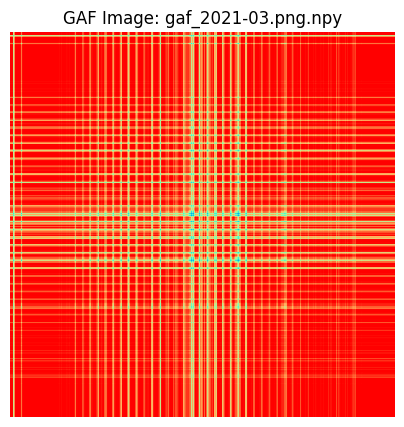

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2021-04.png.npy...


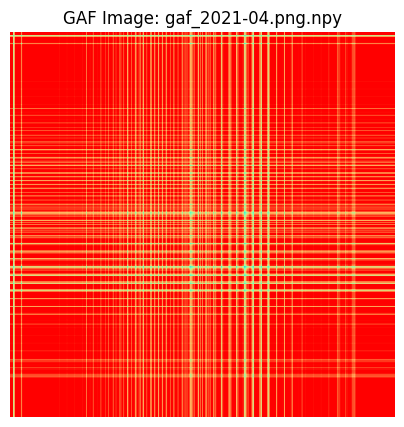

DETECTED PATTERN: Bearish
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2021-05.png.npy...


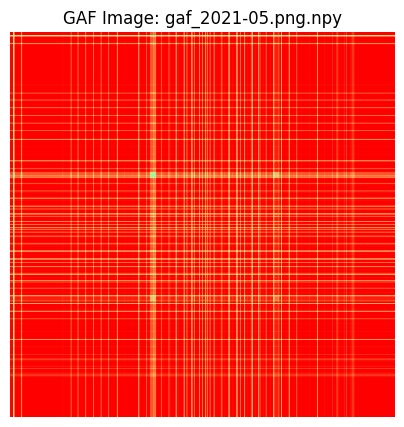

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2021-06.png.npy...


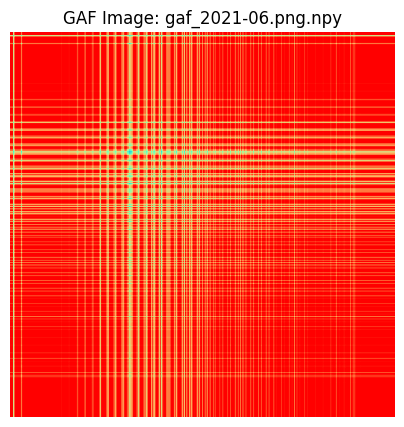

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2021-07.png.npy...


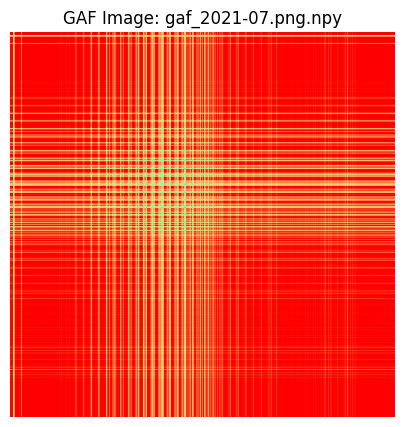

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2021-08.png.npy...


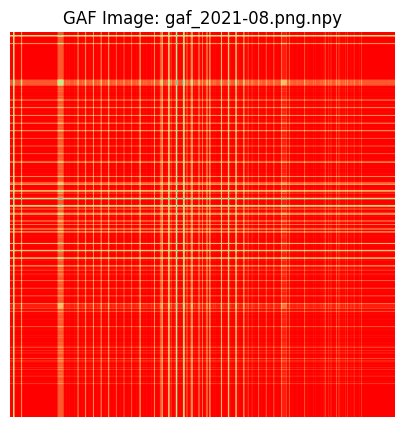

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2021-09.png.npy...


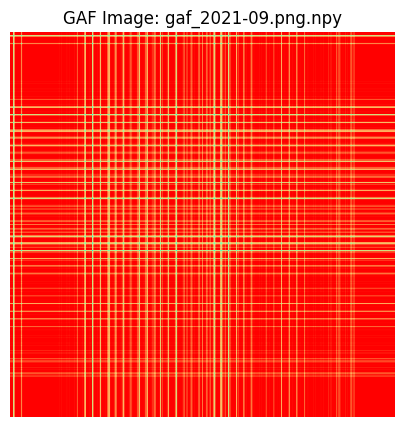

DETECTED PATTERN: Bearish
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2021-10.png.npy...


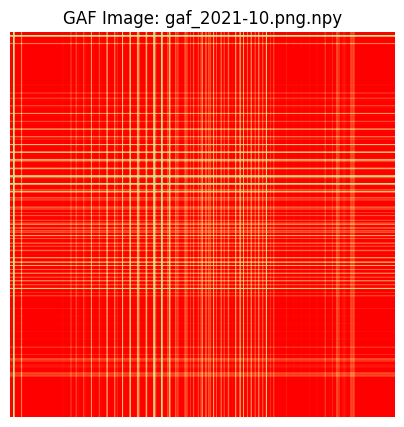

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2021-11.png.npy...


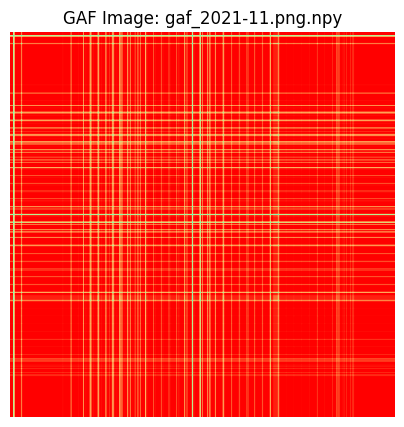

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2021-12.png.npy...


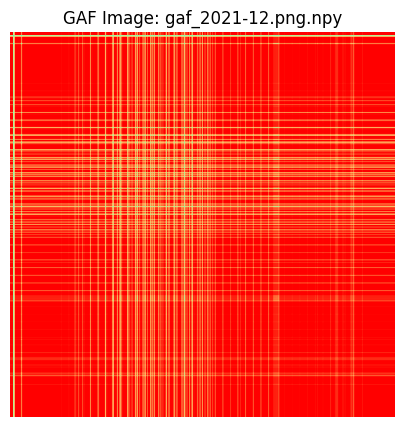

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 0)


Testing gaf_images/gaf_2022-01.png.npy...


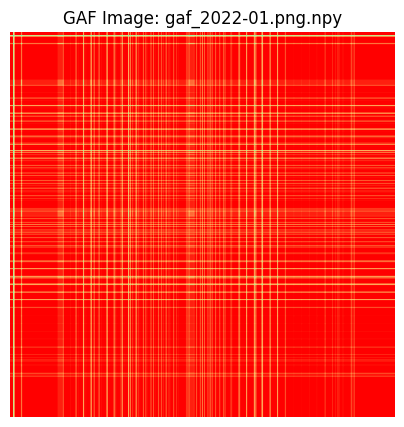

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 0)


Testing gaf_images/gaf_2022-02.png.npy...


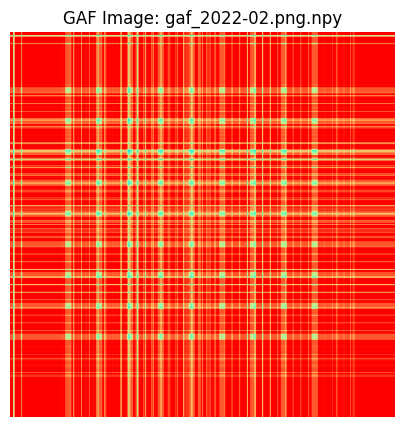

DETECTED PATTERN: Bearish
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2022-03.png.npy...


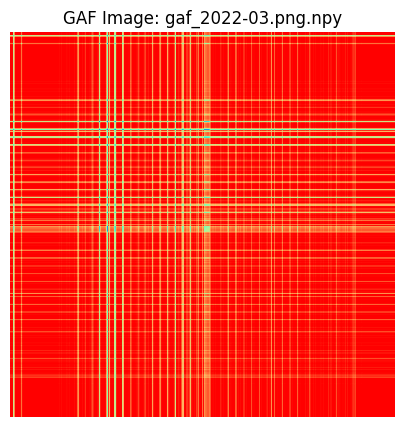

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2022-04.png.npy...


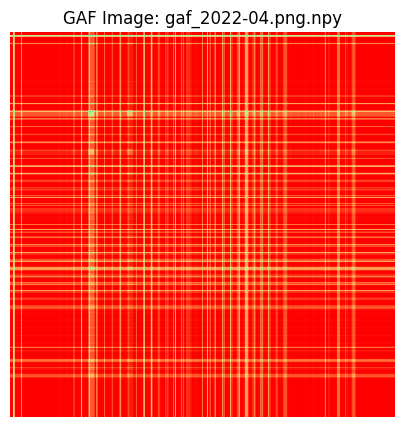

DETECTED PATTERN: Bearish
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2022-05.png.npy...


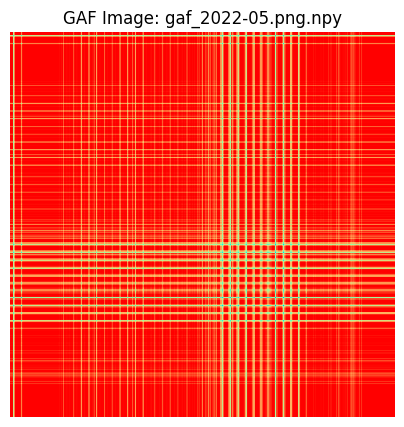

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2022-06.png.npy...


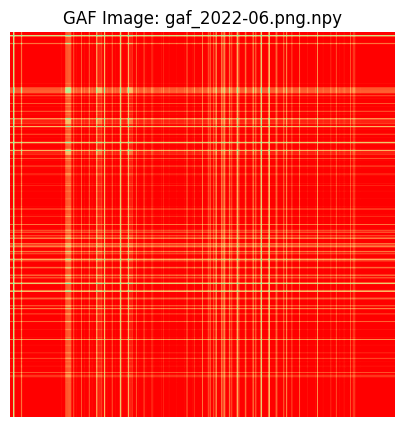

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2022-07.png.npy...


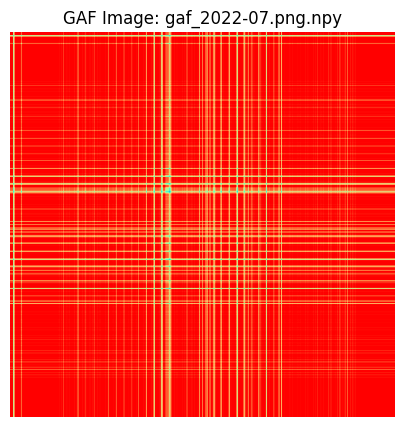

DETECTED PATTERN: No significant pattern detected.
ACTUAL: Bullish (MorningStar: 0, EveningStar: 0)


Testing gaf_images/gaf_2022-08.png.npy...


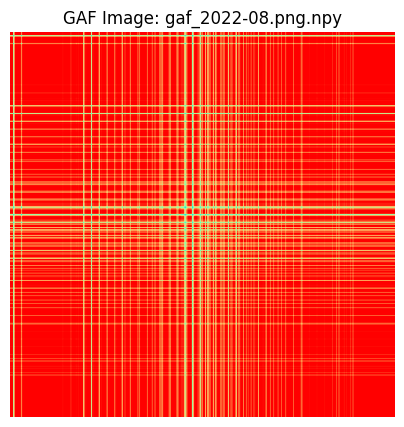

DETECTED PATTERN: Bearish
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2022-09.png.npy...


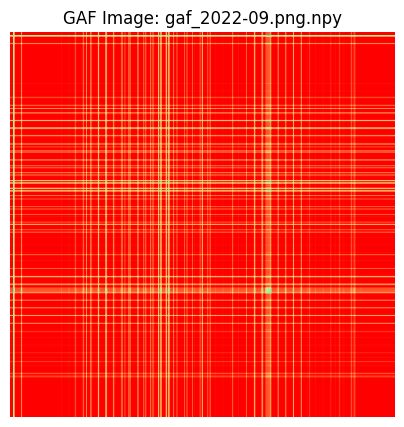

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2022-10.png.npy...


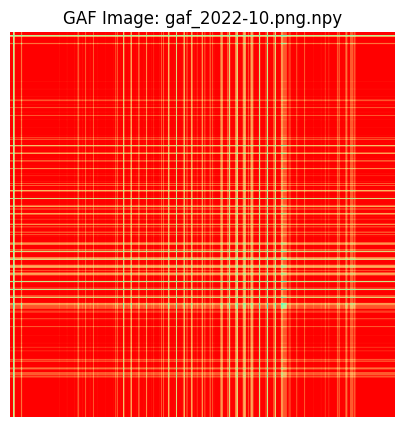

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2022-11.png.npy...


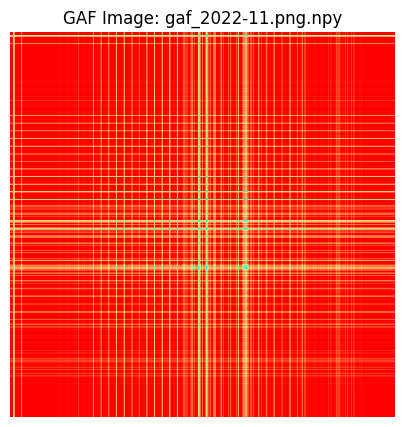

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2022-12.png.npy...


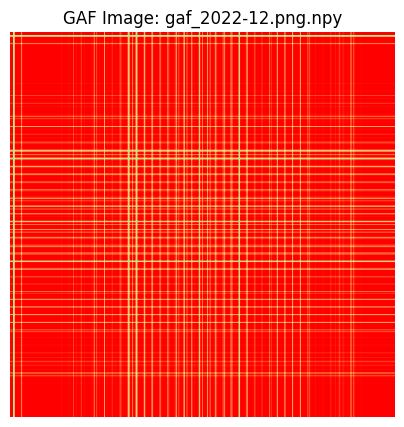

DETECTED PATTERN: Bullish
ACTUAL: Bullish (MorningStar: 1, EveningStar: 0)


Testing gaf_images/gaf_2023-01.png.npy...


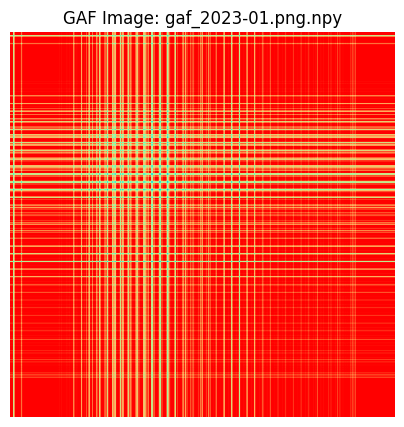

DETECTED PATTERN: Bearish
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2023-02.png.npy...


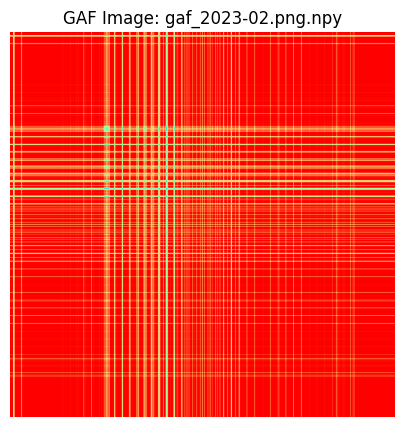

DETECTED PATTERN: No significant pattern detected.
ACTUAL: Bullish (MorningStar: 0, EveningStar: 0)


Testing gaf_images/gaf_2023-03.png.npy...


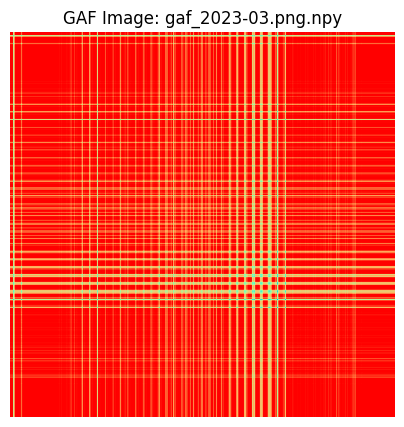

DETECTED PATTERN: Bearish
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2023-04.png.npy...


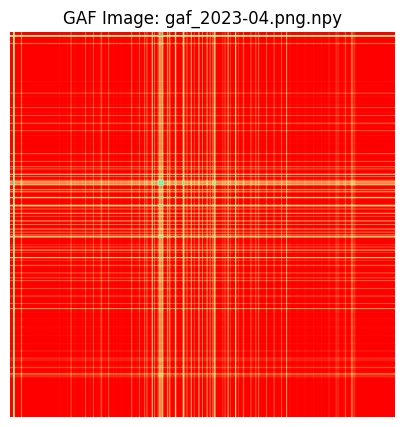

DETECTED PATTERN: No significant pattern detected.
ACTUAL: Bullish (MorningStar: 0, EveningStar: 0)


Testing gaf_images/gaf_2023-05.png.npy...


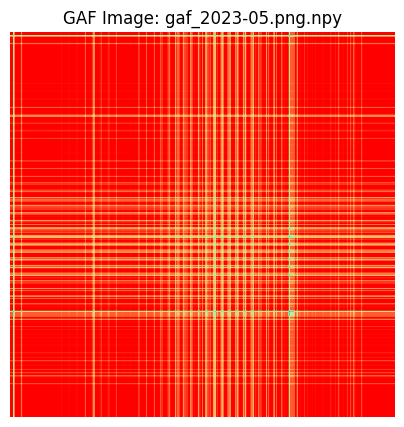

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2023-06.png.npy...


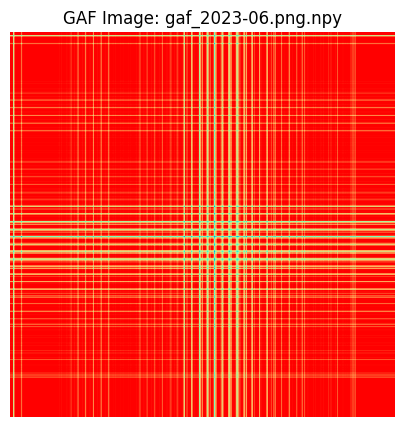

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2023-07.png.npy...


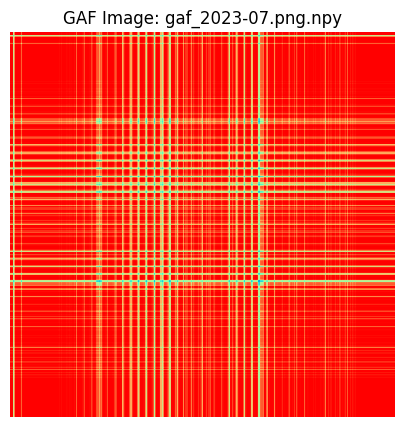

DETECTED PATTERN: Bearish
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2023-08.png.npy...


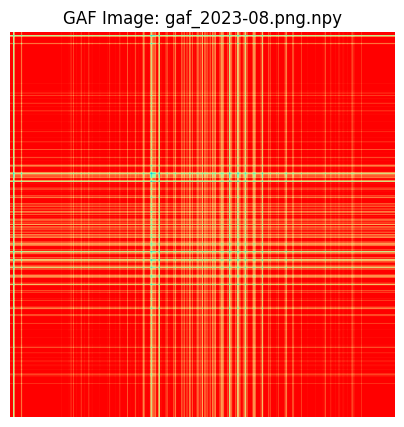

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2023-09.png.npy...


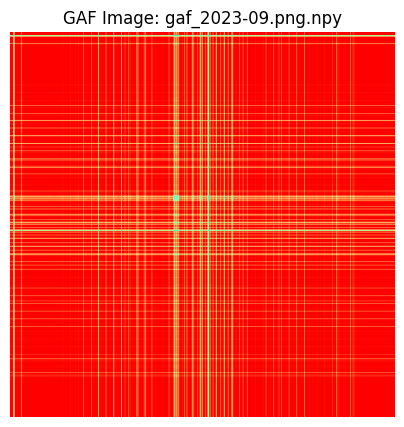

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2023-10.png.npy...


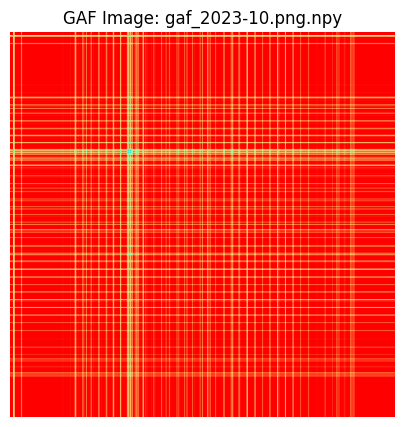

DETECTED PATTERN: (Bullish)
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2023-11.png.npy...


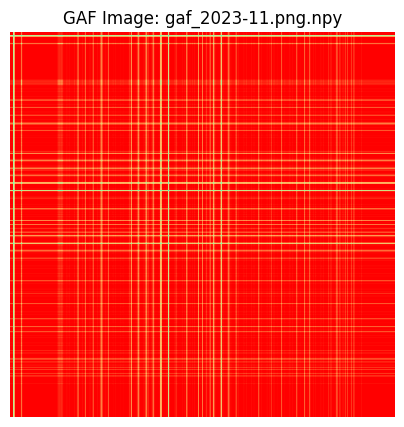

DETECTED PATTERN: Bearish
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2023-12.png.npy...


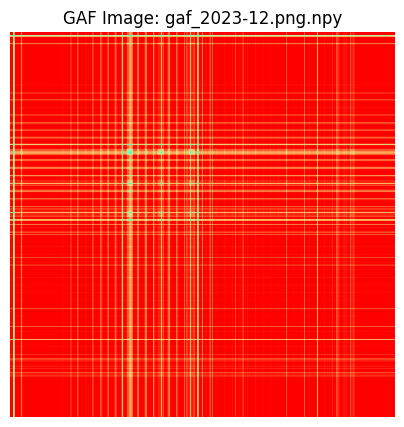

DETECTED PATTERN: No significant pattern detected.
ACTUAL: Bullish (MorningStar: 0, EveningStar: 0)


Testing gaf_images/gaf_2024-01.png.npy...


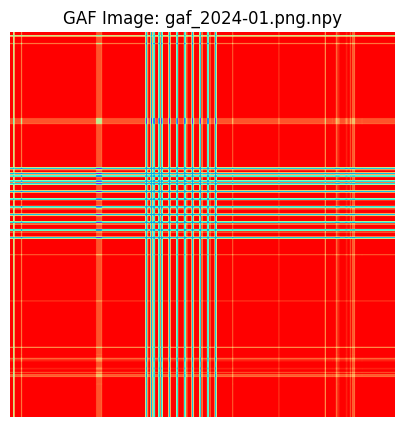

DETECTED PATTERN: Bullish
ACTUAL: Bullish (MorningStar: 1, EveningStar: 0)




In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

def predict_patterns_and_compare(model, gaf_path, transform, device, labels_csv):
    # Load the actual labels from the CSV file
    monthly_labels = pd.read_csv(labels_csv)

    # Extract the filename from the gaf_path
    gaf_filename = gaf_path.split('/')[-1]

    # Find the corresponding row in the DataFrame
    actual_row = monthly_labels[monthly_labels['filename'] == gaf_filename]

    if actual_row.empty:
        print(f"No actual data found for {gaf_filename}.")
        return

    # Get the actual MorningStar and EveningStar labels
    actual_morning_star = actual_row['MorningStar'].values[0]
    actual_evening_star = actual_row['EveningStar'].values[0]
    actual_prediction = actual_row['Prediction'].values[0]

    model.eval()
    gaf_image = np.load(gaf_path)

    # Normalize the GAF image
    gaf_image_normalized = (gaf_image - gaf_image.min()) / (gaf_image.max() - gaf_image.min())
    gaf_image_normalized = (gaf_image_normalized * 255).astype(np.uint8)

    # Convert to PIL Image
    gaf_pil = Image.fromarray(gaf_image_normalized)

    # Apply transformations
    if transform:
        gaf_pil_transformed = transform(gaf_pil).unsqueeze(0).to(device)

    # Perform prediction
    with torch.no_grad():
        output = model(gaf_pil_transformed)
        preds = torch.sigmoid(output) > 0.5  # Convert logits to binary predictions

    # Display the image
    plt.figure(figsize=(5, 5))
    plt.imshow(gaf_pil, cmap='rainbow')
    plt.title(f"GAF Image: {gaf_filename}")
    plt.axis('off')
    plt.show()

    # Determine if it's bullish or bearish
    morning_star, evening_star = preds.cpu().numpy()[0]

    if morning_star and not evening_star:
        predicted_pattern = "Bullish"
    elif evening_star and not morning_star:
        predicted_pattern = "Bearish"
    elif morning_star and evening_star:
        predicted_pattern = "(Bullish)"
    else:
        predicted_pattern = "No significant pattern detected."

    # Output the detected pattern and compare with actual
    print(f"DETECTED PATTERN: {predicted_pattern}")
    print(f"ACTUAL: {actual_prediction} (MorningStar: {actual_morning_star}, EveningStar: {actual_evening_star})")

# Load the CSV file containing all image paths and labels
labels_csv = 'monthly_labels1.csv'
monthly_labels = pd.read_csv(labels_csv)

# Iterate over each row in the CSV and test the model's prediction
for index, row in monthly_labels.iterrows():
    gaf_path = f"gaf_images/{row['filename']}"
    print(f"Testing {gaf_path}...")
    predict_patterns_and_compare(model, gaf_path, transform, device, labels_csv)
    print("\n" + "="*50 + "\n")


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import torch
import numpy as np
from PIL import Image

def predict_patterns_and_compare(model, gaf_path, transform, device, labels_csv):
    # Load the actual labels from the CSV file
    monthly_labels = pd.read_csv(labels_csv)

    # Extract the filename from the gaf_path
    gaf_filename = gaf_path.split('/')[-1]

    # Find the corresponding row in the DataFrame
    actual_row = monthly_labels[monthly_labels['filename'] == gaf_filename]

    if actual_row.empty:
        print(f"No actual data found for {gaf_filename}.")
        return None, None, None  # Return None if no actual data is found

    # Get the actual MorningStar and EveningStar labels
    actual_morning_star = actual_row['MorningStar'].values[0]
    actual_evening_star = actual_row['EveningStar'].values[0]
    actual_prediction = actual_row['Prediction'].values[0]

    model.eval()
    gaf_image = np.load(gaf_path)

    # Normalize the GAF image
    gaf_image_normalized = (gaf_image - gaf_image.min()) / (gaf_image.max() - gaf_image.min())
    gaf_image_normalized = (gaf_image_normalized * 255).astype(np.uint8)

    # Convert to PIL Image
    gaf_pil = Image.fromarray(gaf_image_normalized)

    # Apply transformations
    if transform:
        gaf_pil_transformed = transform(gaf_pil).unsqueeze(0).to(device)

    # Perform prediction
    with torch.no_grad():
        output = model(gaf_pil_transformed)
        preds = torch.sigmoid(output) > 0.5  # Convert logits to binary predictions

    # Determine if it's bullish or bearish
    morning_star, evening_star = preds.cpu().numpy()[0]

    if morning_star and not evening_star:
        predicted_pattern = "Bullish"
    elif evening_star and not morning_star:
        predicted_pattern = "Bearish"
    elif morning_star and evening_star:
        predicted_pattern = "(Bullish)"
    else:
        predicted_pattern = "No significant pattern detected."

    return gaf_filename, predicted_pattern, actual_prediction  # Return the filename, detected, and actual pattern

# Load the CSV file containing all image paths and labels
labels_csv = 'monthly_labels1.csv'
monthly_labels = pd.read_csv(labels_csv)

# Initialize lists to store the results
results = []

# Iterate over each row in the CSV and test the model's prediction
for index, row in monthly_labels.iterrows():
    gaf_path = f"gaf_images/{row['filename']}"
    print(f"Testing {gaf_path}...")
    filename, detected_pattern, actual = predict_patterns_and_compare(model, gaf_path, transform, device, labels_csv)
    if filename and detected_pattern and actual:
        results.append([filename, detected_pattern, actual])  # Append the results to the list

# Create a new DataFrame from the results
results_df = pd.DataFrame(results, columns=['FILENAME', 'DETECTED PATTERN', 'ACTUAL'])

# Save the new DataFrame to a CSV file
results_df.to_csv('detected_vs_actual_patterns.csv', index=False)

# Print the full DataFrame
print(results_df)


Testing gaf_images/gaf_2020-01.png.npy...
Testing gaf_images/gaf_2020-02.png.npy...
Testing gaf_images/gaf_2020-03.png.npy...
Testing gaf_images/gaf_2020-04.png.npy...
Testing gaf_images/gaf_2020-05.png.npy...
Testing gaf_images/gaf_2020-06.png.npy...
Testing gaf_images/gaf_2020-07.png.npy...
Testing gaf_images/gaf_2020-08.png.npy...
Testing gaf_images/gaf_2020-09.png.npy...
Testing gaf_images/gaf_2020-10.png.npy...
Testing gaf_images/gaf_2020-11.png.npy...
Testing gaf_images/gaf_2020-12.png.npy...
Testing gaf_images/gaf_2021-01.png.npy...
Testing gaf_images/gaf_2021-02.png.npy...
Testing gaf_images/gaf_2021-03.png.npy...
Testing gaf_images/gaf_2021-04.png.npy...
Testing gaf_images/gaf_2021-05.png.npy...
Testing gaf_images/gaf_2021-06.png.npy...
Testing gaf_images/gaf_2021-07.png.npy...
Testing gaf_images/gaf_2021-08.png.npy...
Testing gaf_images/gaf_2021-09.png.npy...
Testing gaf_images/gaf_2021-10.png.npy...
Testing gaf_images/gaf_2021-11.png.npy...
Testing gaf_images/gaf_2021-12.png

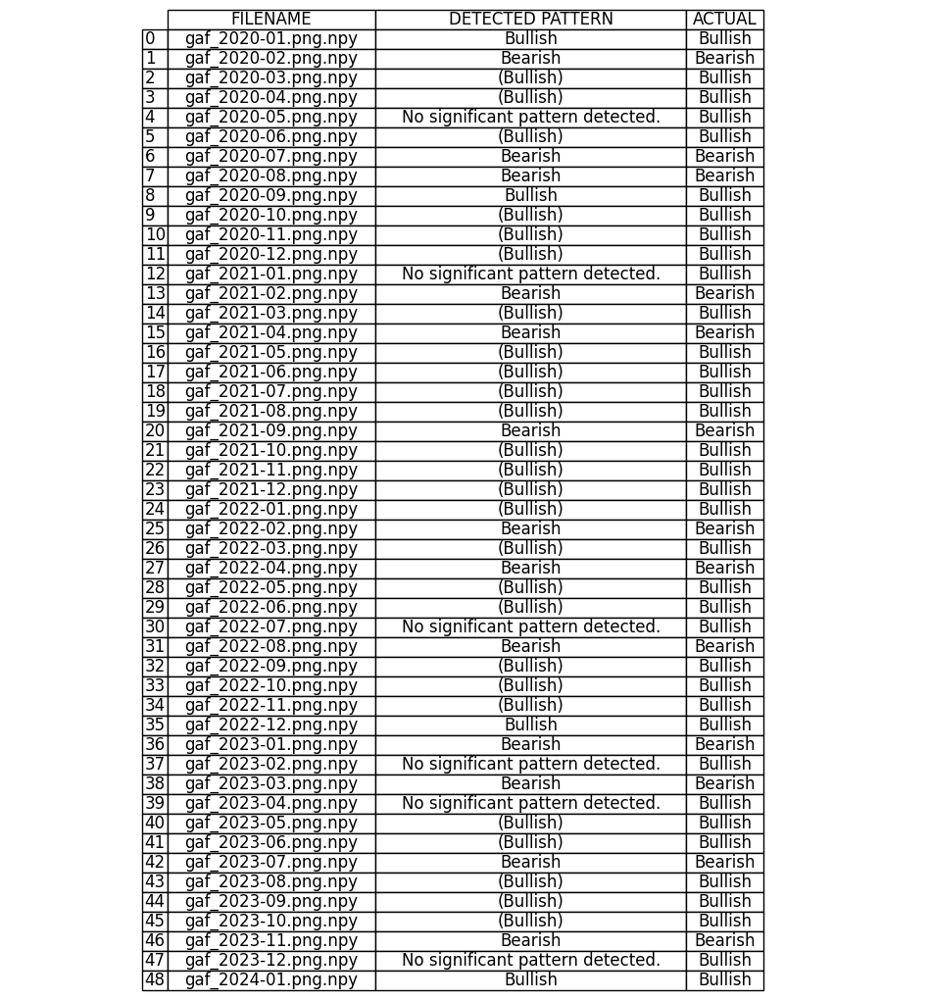

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming results_df is already created as per the previous code
# If not, you would load it from the CSV file or create it again

# Example: Load results_df from CSV if needed
# results_df = pd.read_csv('detected_vs_actual_patterns.csv')

# Create a figure and a subplot
fig, ax = plt.subplots(figsize=(12, 8))  # Adjust figsize for better visualization

# Hide axes
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
ax.set_frame_on(False)

# Render the DataFrame as a table in the plot
tbl = pd.plotting.table(ax, results_df, loc='center', cellLoc='center', colWidths=[0.2]*len(results_df.columns))

# Style the table
tbl.auto_set_font_size(False)
tbl.set_fontsize(12)
tbl.scale(1.2, 1.2)  # Scale the table for better readability

# Set table properties
tbl.auto_set_column_width(col=list(range(len(results_df.columns))))  # Adjust column widths

# Show the plot (which contains the table)
plt.show()


In [ ]:
def predict_patterns(model, gaf_path, transform, device, threshold=0.5):
    model.eval()
    gaf_image = np.load(gaf_path)
    gaf_image = (gaf_image - gaf_image.min()) / (gaf_image.max() - gaf_image.min())
    gaf_image = (gaf_image * 255).astype(np.uint8)
    gaf_pil = Image.fromarray(gaf_image)

    if transform:
        gaf_pil = transform(gaf_pil)

    gaf_pil = gaf_pil.unsqueeze(0).to(device)  # Add batch dimension

    with torch.no_grad():
        output = model(gaf_pil)
        probs = torch.sigmoid(output)
        preds = probs > threshold
        return preds.cpu().numpy()[0], probs.cpu().numpy()[0]

# Example usage
new_gaf_path = 'gaf_images/gaf_2024-01.png.npy'
preds, probs = predict_patterns(model, new_gaf_path, transform, device)
print(f"Morning Star: {preds[0]} (Probability: {probs[0]:.2f})")
print(f"Evening Star: {preds[1]} (Probability: {probs[1]:.2f})")

Morning Star: True (Probability: 0.94)
Evening Star: False (Probability: 0.00)


Testing gaf_images/gaf_2020-01.png.npy...


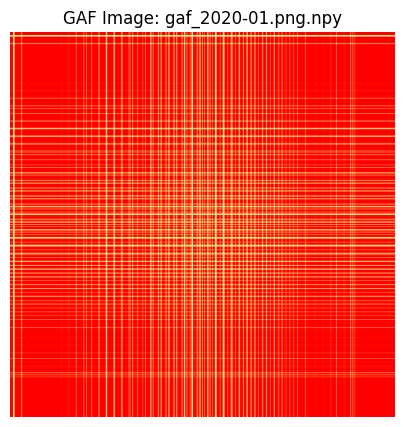

DETECTED PATTERN: Bullish
Morning Star Probability: 0.99, Evening Star Probability: 0.00
ACTUAL: Bullish (MorningStar: 1, EveningStar: 0)


Testing gaf_images/gaf_2020-02.png.npy...


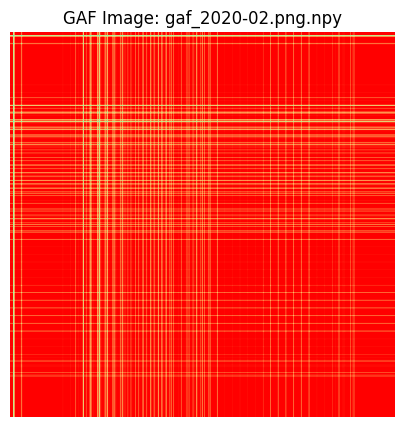

DETECTED PATTERN: Bearish
Morning Star Probability: 0.01, Evening Star Probability: 0.91
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2020-03.png.npy...


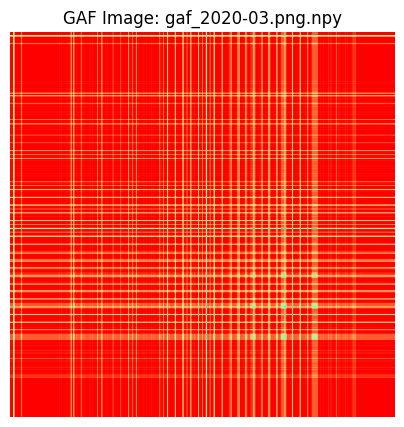

DETECTED PATTERN: Bullish
Morning Star Probability: 0.95, Evening Star Probability: 0.89
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2020-04.png.npy...


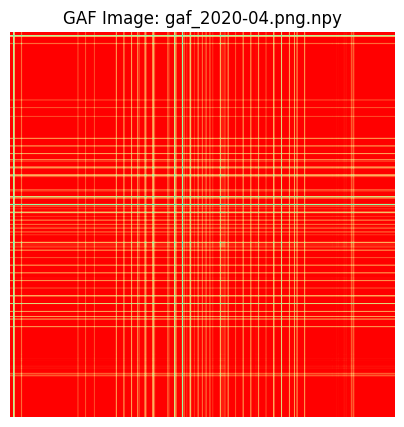

DETECTED PATTERN: Bullish
Morning Star Probability: 0.98, Evening Star Probability: 0.96
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2020-05.png.npy...


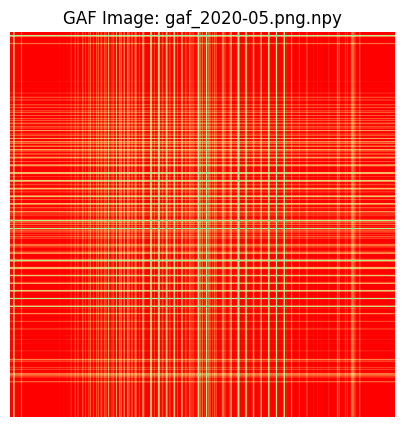

DETECTED PATTERN: Bullish
Morning Star Probability: 0.01, Evening Star Probability: 0.00
ACTUAL: Bullish (MorningStar: 0, EveningStar: 0)


Testing gaf_images/gaf_2020-06.png.npy...


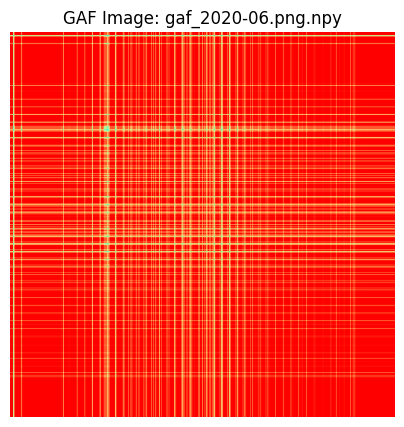

DETECTED PATTERN: Bullish
Morning Star Probability: 0.94, Evening Star Probability: 0.85
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2020-07.png.npy...


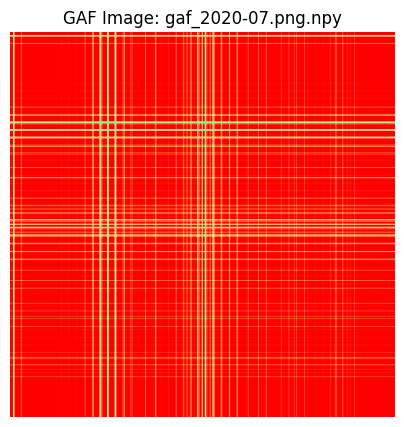

DETECTED PATTERN: Bearish
Morning Star Probability: 0.08, Evening Star Probability: 0.82
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2020-08.png.npy...


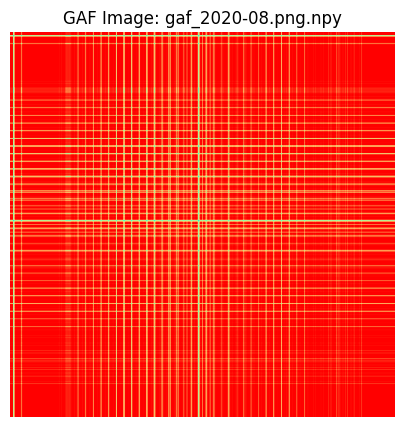

DETECTED PATTERN: Bearish
Morning Star Probability: 0.07, Evening Star Probability: 0.84
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2020-09.png.npy...


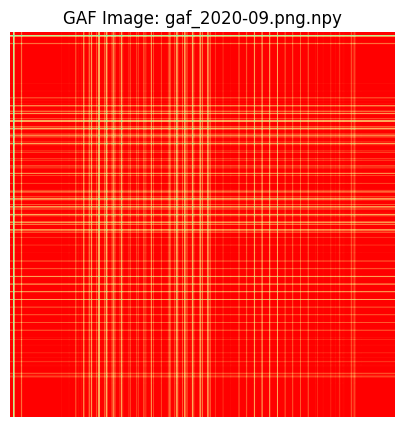

DETECTED PATTERN: Bullish
Morning Star Probability: 0.95, Evening Star Probability: 0.11
ACTUAL: Bullish (MorningStar: 1, EveningStar: 0)


Testing gaf_images/gaf_2020-10.png.npy...


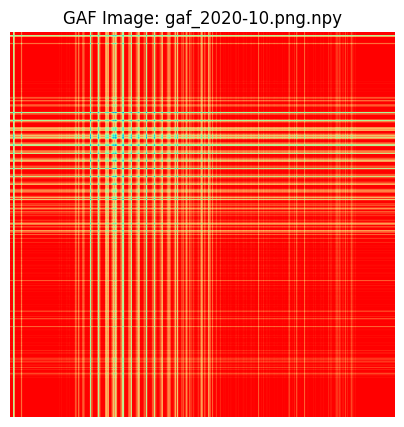

DETECTED PATTERN: Bullish
Morning Star Probability: 0.92, Evening Star Probability: 0.88
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2020-11.png.npy...


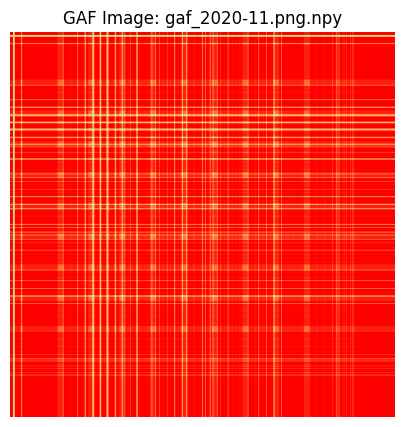

DETECTED PATTERN: Bearish
Morning Star Probability: 0.91, Evening Star Probability: 0.91
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2020-12.png.npy...


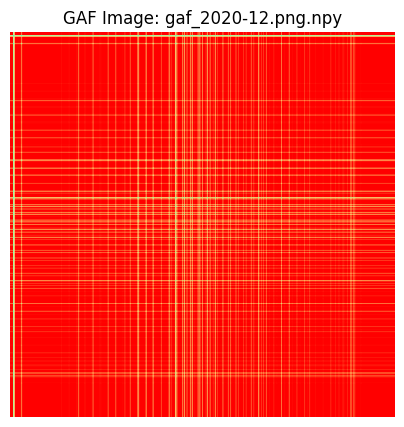

DETECTED PATTERN: Bullish
Morning Star Probability: 0.96, Evening Star Probability: 0.83
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2021-01.png.npy...


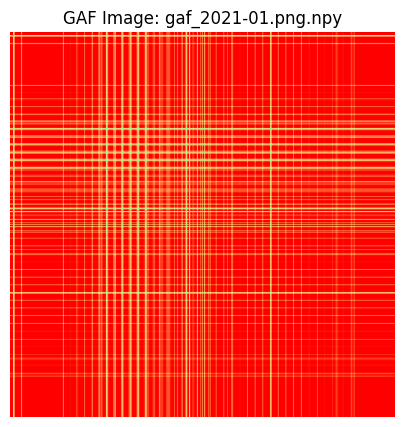

DETECTED PATTERN: Bullish
Morning Star Probability: 0.01, Evening Star Probability: 0.00
ACTUAL: Bullish (MorningStar: 0, EveningStar: 0)


Testing gaf_images/gaf_2021-02.png.npy...


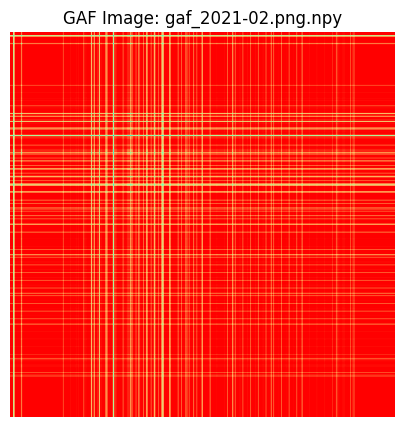

DETECTED PATTERN: Bearish
Morning Star Probability: 0.01, Evening Star Probability: 0.89
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2021-03.png.npy...


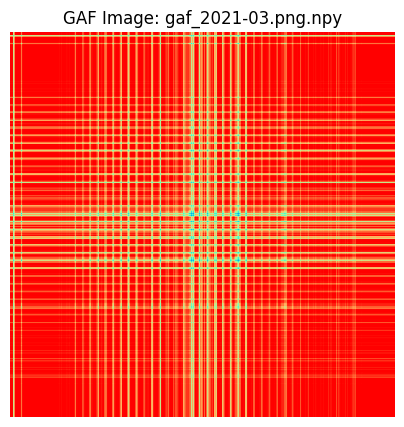

DETECTED PATTERN: Bearish
Morning Star Probability: 0.86, Evening Star Probability: 0.88
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2021-04.png.npy...


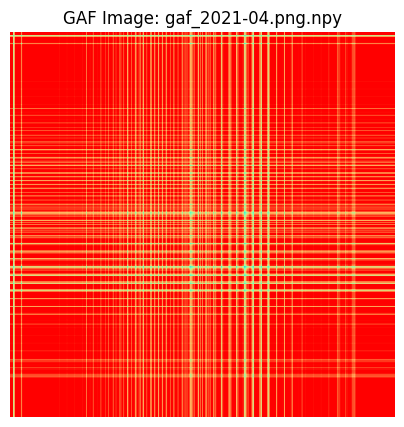

DETECTED PATTERN: Bearish
Morning Star Probability: 0.00, Evening Star Probability: 0.88
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2021-05.png.npy...


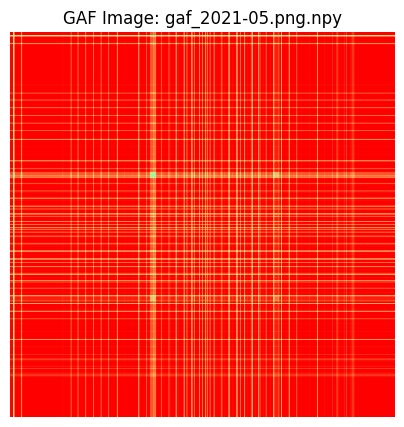

DETECTED PATTERN: Bullish
Morning Star Probability: 0.95, Evening Star Probability: 0.93
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2021-06.png.npy...


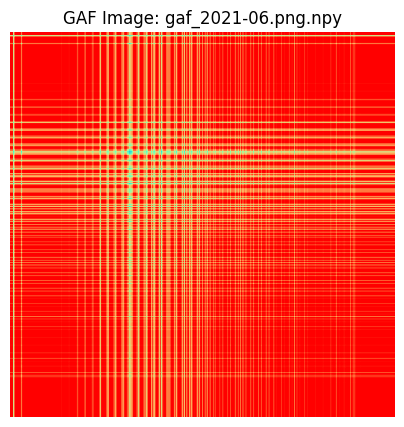

DETECTED PATTERN: Bullish
Morning Star Probability: 0.95, Evening Star Probability: 0.82
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2021-07.png.npy...


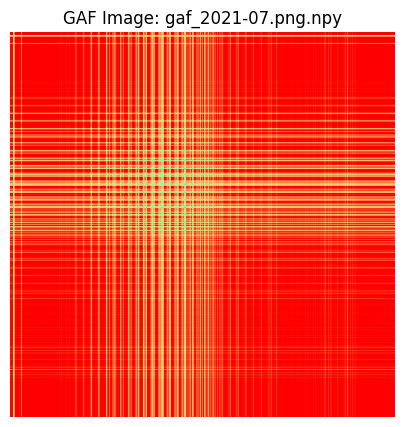

DETECTED PATTERN: Bullish
Morning Star Probability: 0.92, Evening Star Probability: 0.85
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2021-08.png.npy...


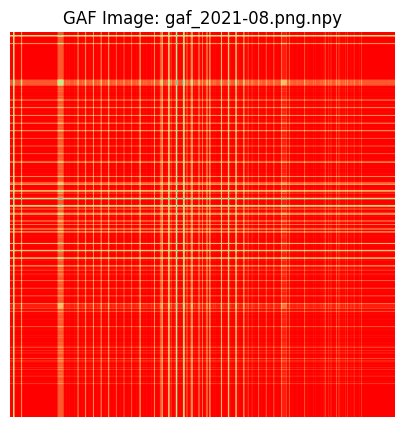

DETECTED PATTERN: Bullish
Morning Star Probability: 0.97, Evening Star Probability: 0.95
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2021-09.png.npy...


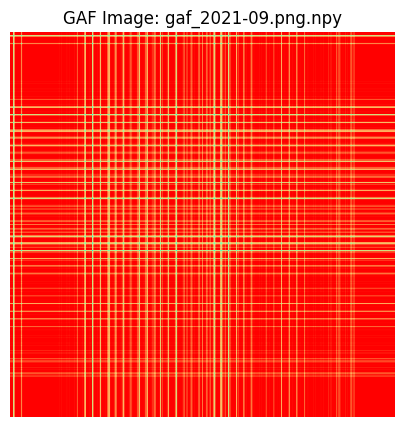

DETECTED PATTERN: Bearish
Morning Star Probability: 0.05, Evening Star Probability: 0.83
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2021-10.png.npy...


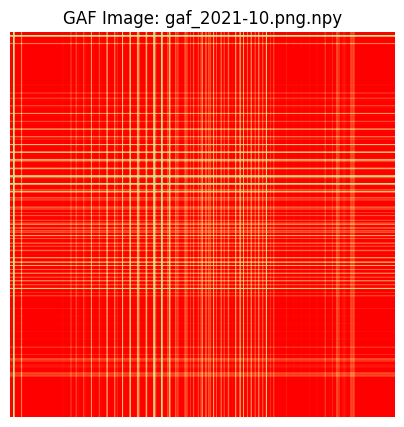

DETECTED PATTERN: Bullish
Morning Star Probability: 0.93, Evening Star Probability: 0.89
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2021-11.png.npy...


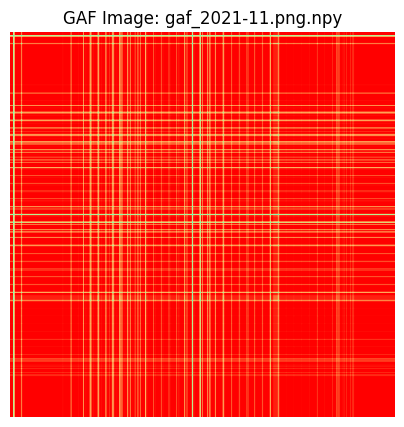

DETECTED PATTERN: Bullish
Morning Star Probability: 0.96, Evening Star Probability: 0.88
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2021-12.png.npy...


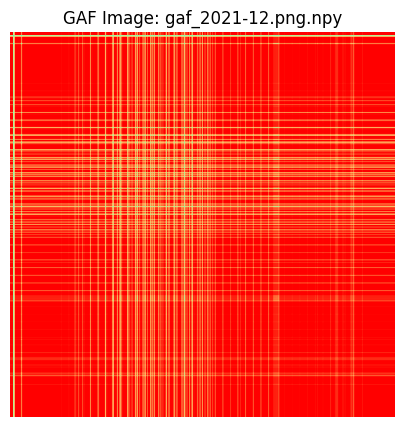

DETECTED PATTERN: Bullish
Morning Star Probability: 0.77, Evening Star Probability: 0.65
ACTUAL: Bullish (MorningStar: 1, EveningStar: 0)


Testing gaf_images/gaf_2022-01.png.npy...


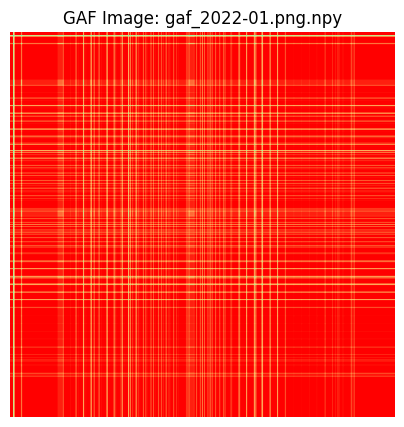

DETECTED PATTERN: Bullish
Morning Star Probability: 0.84, Evening Star Probability: 0.74
ACTUAL: Bullish (MorningStar: 1, EveningStar: 0)


Testing gaf_images/gaf_2022-02.png.npy...


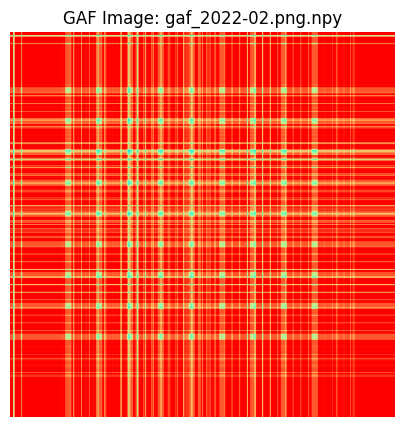

DETECTED PATTERN: Bearish
Morning Star Probability: 0.10, Evening Star Probability: 0.88
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2022-03.png.npy...


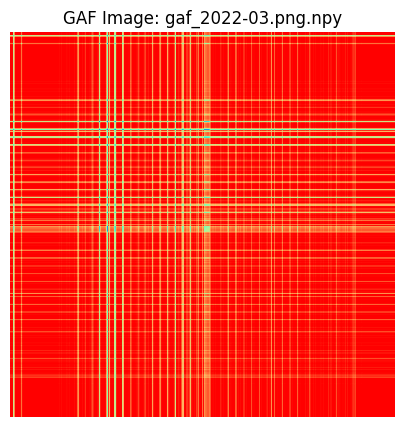

DETECTED PATTERN: Bullish
Morning Star Probability: 0.93, Evening Star Probability: 0.89
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2022-04.png.npy...


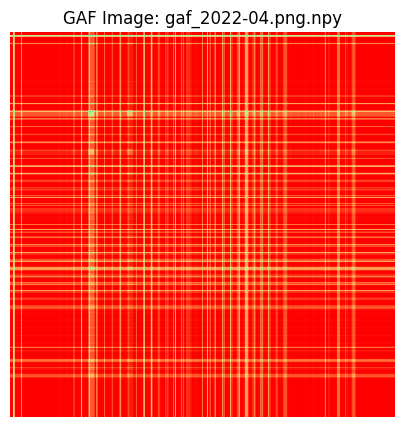

DETECTED PATTERN: Bearish
Morning Star Probability: 0.03, Evening Star Probability: 0.92
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2022-05.png.npy...


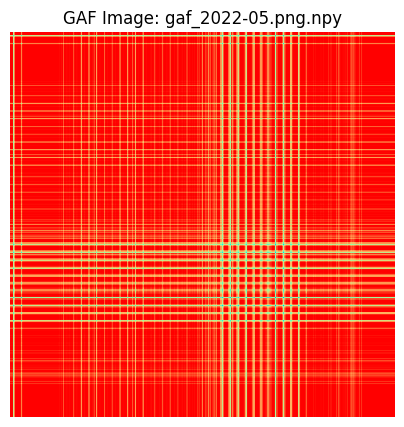

DETECTED PATTERN: Bullish
Morning Star Probability: 0.95, Evening Star Probability: 0.90
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2022-06.png.npy...


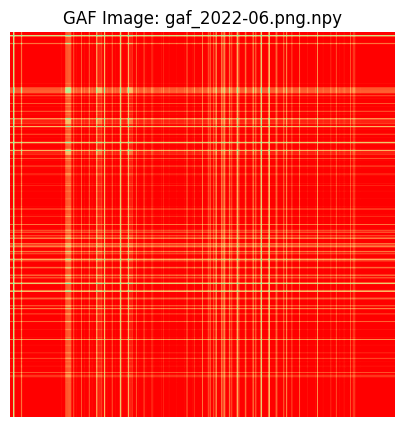

DETECTED PATTERN: Bullish
Morning Star Probability: 0.88, Evening Star Probability: 0.81
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2022-07.png.npy...


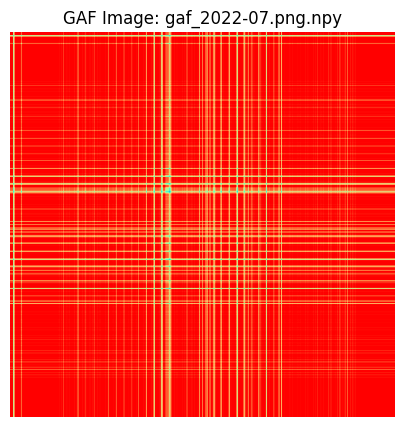

DETECTED PATTERN: Bearish
Morning Star Probability: 0.01, Evening Star Probability: 0.02
ACTUAL: Bullish (MorningStar: 0, EveningStar: 0)


Testing gaf_images/gaf_2022-08.png.npy...


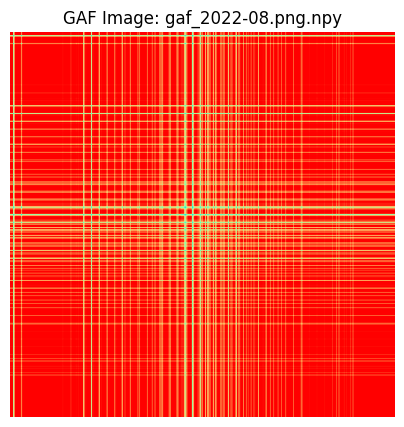

DETECTED PATTERN: Bearish
Morning Star Probability: 0.01, Evening Star Probability: 0.85
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2022-09.png.npy...


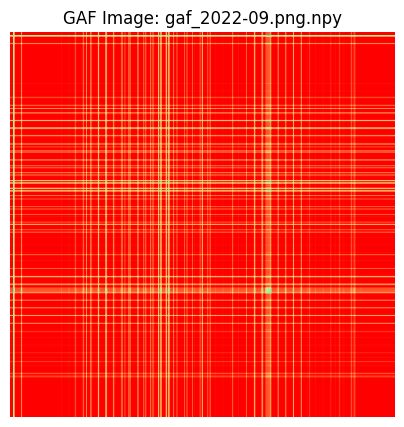

DETECTED PATTERN: Bearish
Morning Star Probability: 0.85, Evening Star Probability: 0.88
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2022-10.png.npy...


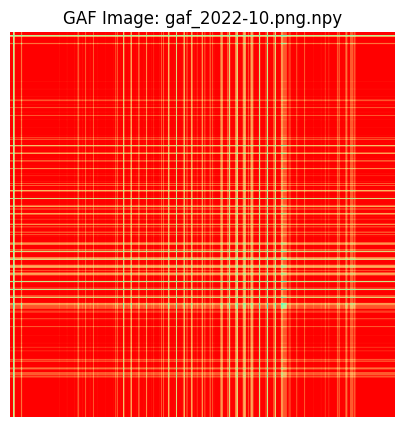

DETECTED PATTERN: Bullish
Morning Star Probability: 0.93, Evening Star Probability: 0.92
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2022-11.png.npy...


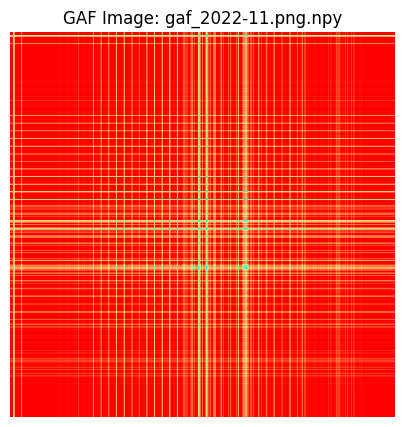

DETECTED PATTERN: Bullish
Morning Star Probability: 0.90, Evening Star Probability: 0.89
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2022-12.png.npy...


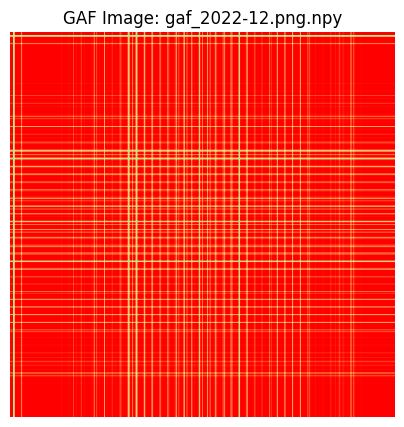

DETECTED PATTERN: Bullish
Morning Star Probability: 0.92, Evening Star Probability: 0.01
ACTUAL: Bullish (MorningStar: 1, EveningStar: 0)


Testing gaf_images/gaf_2023-01.png.npy...


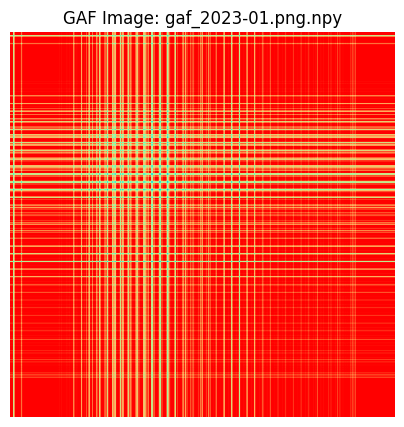

DETECTED PATTERN: Bearish
Morning Star Probability: 0.26, Evening Star Probability: 0.91
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2023-02.png.npy...


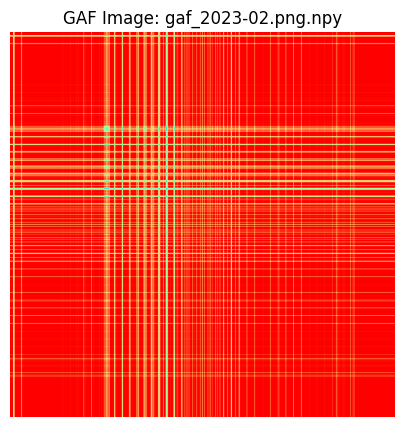

DETECTED PATTERN: Bearish
Morning Star Probability: 0.02, Evening Star Probability: 0.03
ACTUAL: Bullish (MorningStar: 0, EveningStar: 0)


Testing gaf_images/gaf_2023-03.png.npy...


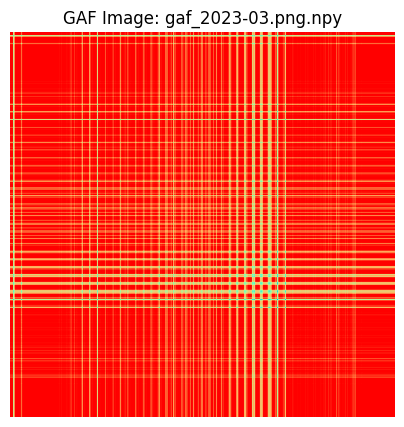

DETECTED PATTERN: Bearish
Morning Star Probability: 0.02, Evening Star Probability: 0.87
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2023-04.png.npy...


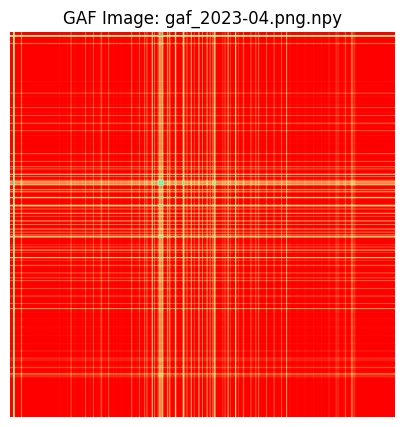

DETECTED PATTERN: Bearish
Morning Star Probability: 0.00, Evening Star Probability: 0.01
ACTUAL: Bullish (MorningStar: 0, EveningStar: 0)


Testing gaf_images/gaf_2023-05.png.npy...


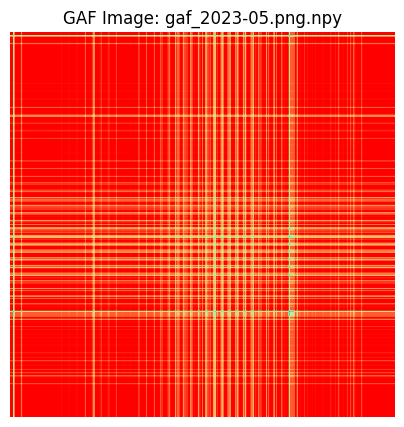

DETECTED PATTERN: Bearish
Morning Star Probability: 0.84, Evening Star Probability: 0.90
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2023-06.png.npy...


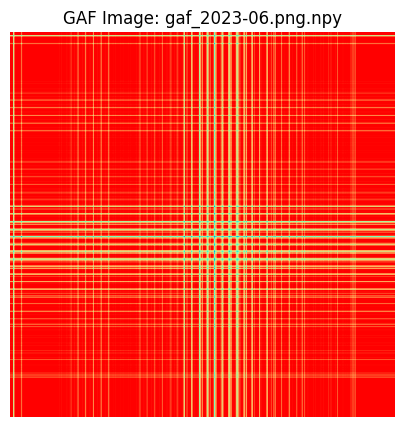

DETECTED PATTERN: Bullish
Morning Star Probability: 0.93, Evening Star Probability: 0.90
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2023-07.png.npy...


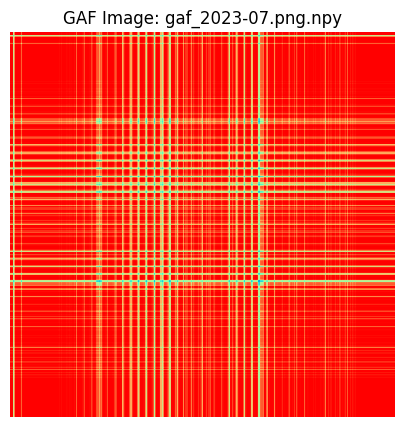

DETECTED PATTERN: Bearish
Morning Star Probability: 0.02, Evening Star Probability: 0.96
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2023-08.png.npy...


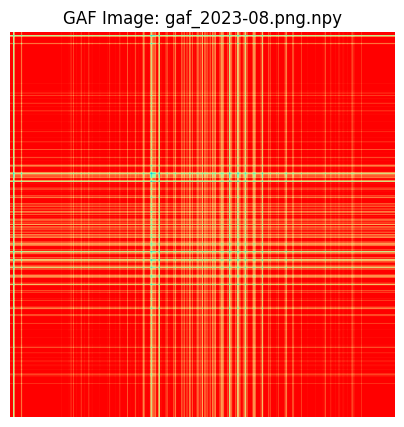

DETECTED PATTERN: Bullish
Morning Star Probability: 0.92, Evening Star Probability: 0.88
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2023-09.png.npy...


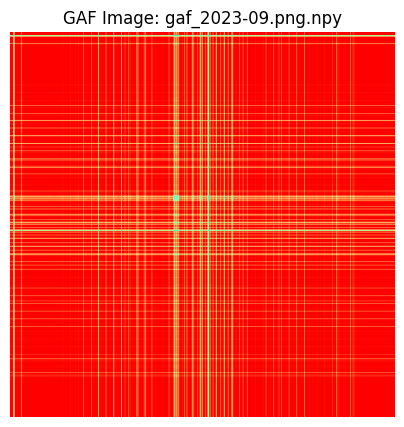

DETECTED PATTERN: Bullish
Morning Star Probability: 0.67, Evening Star Probability: 0.67
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2023-10.png.npy...


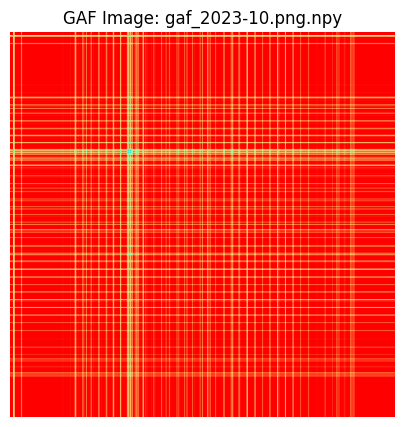

DETECTED PATTERN: Bullish
Morning Star Probability: 0.95, Evening Star Probability: 0.91
ACTUAL: Bullish (MorningStar: 1, EveningStar: 1)


Testing gaf_images/gaf_2023-11.png.npy...


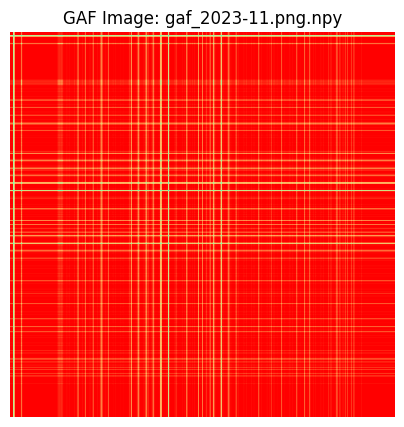

DETECTED PATTERN: Bearish
Morning Star Probability: 0.09, Evening Star Probability: 0.83
ACTUAL: Bearish (MorningStar: 0, EveningStar: 1)


Testing gaf_images/gaf_2023-12.png.npy...


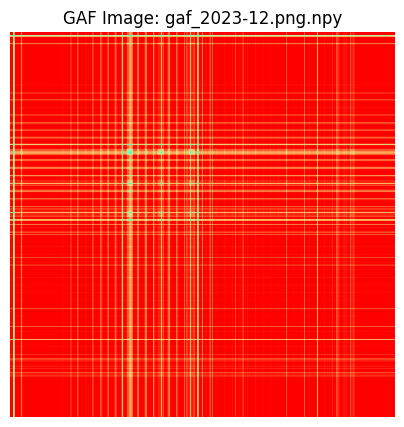

DETECTED PATTERN: Bullish
Morning Star Probability: 0.01, Evening Star Probability: 0.00
ACTUAL: Bullish (MorningStar: 0, EveningStar: 0)


Testing gaf_images/gaf_2024-01.png.npy...


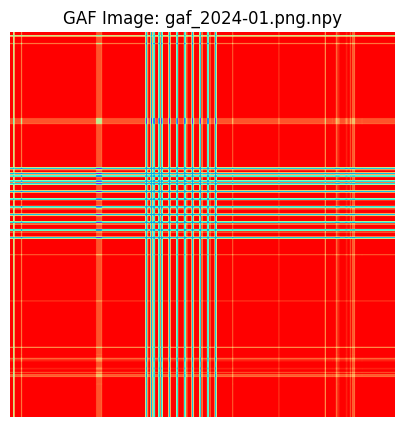

DETECTED PATTERN: Bullish
Morning Star Probability: 0.94, Evening Star Probability: 0.00
ACTUAL: Bullish (MorningStar: 1, EveningStar: 0)




In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import torch
import numpy as np
from PIL import Image

def predict_patterns(model, gaf_path, transform, device, threshold=0.5):
    model.eval()
    gaf_image = np.load(gaf_path)
    gaf_image = (gaf_image - gaf_image.min()) / (gaf_image.max() - gaf_image.min())
    gaf_image = (gaf_image * 255).astype(np.uint8)
    gaf_pil = Image.fromarray(gaf_image)

    if transform:
        gaf_pil = transform(gaf_pil)

    gaf_pil = gaf_pil.unsqueeze(0).to(device)  # Add batch dimension

    with torch.no_grad():
        output = model(gaf_pil)
        probs = torch.sigmoid(output)
        preds = probs > threshold
        return preds.cpu().numpy()[0], probs.cpu().numpy()[0]

def predict_patterns_and_compare(model, gaf_path, transform, device, labels_csv, threshold=0.5):
    # Load the actual labels from the CSV file
    monthly_labels = pd.read_csv(labels_csv)

    # Extract the filename from the gaf_path
    gaf_filename = gaf_path.split('/')[-1]

    # Find the corresponding row in the DataFrame
    actual_row = monthly_labels[monthly_labels['filename'] == gaf_filename]

    if actual_row.empty:
        print(f"No actual data found for {gaf_filename}.")
        return

    # Get the actual MorningStar and EveningStar labels
    actual_morning_star = actual_row['MorningStar'].values[0]
    actual_evening_star = actual_row['EveningStar'].values[0]
    actual_prediction = actual_row['Prediction'].values[0]

    # Get the model predictions and probabilities
    preds, probs = predict_patterns(model, gaf_path, transform, device, threshold)

    # Determine the predicted pattern based on probabilities
    if probs[0] > probs[1]:
        predicted_pattern = "Bullish"
    elif probs[1] > probs[0]:
        predicted_pattern = "Bearish"
    else:
        predicted_pattern = "Bullish"  # If both probabilities are the same

    # Display the image
    gaf_image = np.load(gaf_path)
    gaf_image_normalized = (gaf_image - gaf_image.min()) / (gaf_image.max() - gaf_image.min())
    gaf_image_normalized = (gaf_image_normalized * 255).astype(np.uint8)
    gaf_pil = Image.fromarray(gaf_image_normalized)

    plt.figure(figsize=(5, 5))
    plt.imshow(gaf_pil, cmap='rainbow')
    plt.title(f"GAF Image: {gaf_filename}")
    plt.axis('off')
    plt.show()

    # Output the detected pattern and compare with actual
    print(f"DETECTED PATTERN: {predicted_pattern}")
    print(f"Morning Star Probability: {probs[0]:.2f}, Evening Star Probability: {probs[1]:.2f}")
    print(f"ACTUAL: {actual_prediction} (MorningStar: {actual_morning_star}, EveningStar: {actual_evening_star})")

# Load the CSV file containing all image paths and labels
labels_csv = 'monthly_labels1.csv'
monthly_labels = pd.read_csv(labels_csv)

# Iterate over each row in the CSV and test the model's prediction
for index, row in monthly_labels.iterrows():
    gaf_path = f"gaf_images/{row['filename']}"
    print(f"Testing {gaf_path}...")
    predict_patterns_and_compare(model, gaf_path, transform, device, labels_csv)
    print("\n" + "="*50 + "\n")


Testing gaf_images/gaf_2020-01.png.npy...
Testing gaf_images/gaf_2020-02.png.npy...
Testing gaf_images/gaf_2020-03.png.npy...
Testing gaf_images/gaf_2020-04.png.npy...
Testing gaf_images/gaf_2020-05.png.npy...
Testing gaf_images/gaf_2020-06.png.npy...
Testing gaf_images/gaf_2020-07.png.npy...
Testing gaf_images/gaf_2020-08.png.npy...
Testing gaf_images/gaf_2020-09.png.npy...
Testing gaf_images/gaf_2020-10.png.npy...
Testing gaf_images/gaf_2020-11.png.npy...
Testing gaf_images/gaf_2020-12.png.npy...
Testing gaf_images/gaf_2021-01.png.npy...
Testing gaf_images/gaf_2021-02.png.npy...
Testing gaf_images/gaf_2021-03.png.npy...
Testing gaf_images/gaf_2021-04.png.npy...
Testing gaf_images/gaf_2021-05.png.npy...
Testing gaf_images/gaf_2021-06.png.npy...
Testing gaf_images/gaf_2021-07.png.npy...
Testing gaf_images/gaf_2021-08.png.npy...
Testing gaf_images/gaf_2021-09.png.npy...
Testing gaf_images/gaf_2021-10.png.npy...
Testing gaf_images/gaf_2021-11.png.npy...
Testing gaf_images/gaf_2021-12.png

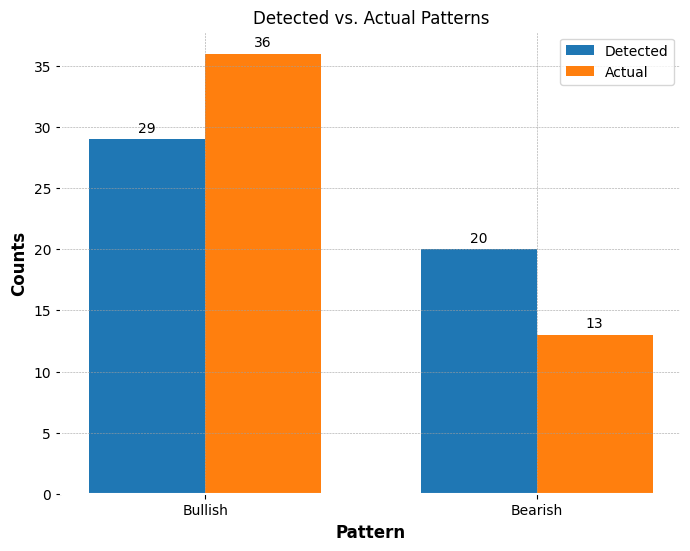

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import torch
import numpy as np
from PIL import Image
from collections import Counter

def predict_patterns(model, gaf_path, transform, device, threshold=0.5):
    model.eval()
    gaf_image = np.load(gaf_path)
    gaf_image = (gaf_image - gaf_image.min()) / (gaf_image.max() - gaf_image.min())
    gaf_image = (gaf_image * 255).astype(np.uint8)
    gaf_pil = Image.fromarray(gaf_image)

    if transform:
        gaf_pil = transform(gaf_pil)

    gaf_pil = gaf_pil.unsqueeze(0).to(device)  # Add batch dimension

    with torch.no_grad():
        output = model(gaf_pil)
        probs = torch.sigmoid(output)
        preds = probs > threshold
        return preds.cpu().numpy()[0], probs.cpu().numpy()[0]

def predict_patterns_and_compare(model, gaf_path, transform, device, labels_csv, threshold=0.5):
    # Load the actual labels from the CSV file
    monthly_labels = pd.read_csv(labels_csv)

    # Extract the filename from the gaf_path
    gaf_filename = gaf_path.split('/')[-1]

    # Find the corresponding row in the DataFrame
    actual_row = monthly_labels[monthly_labels['filename'] == gaf_filename]

    if actual_row.empty:
        print(f"No actual data found for {gaf_filename}.")
        return None, None

    # Get the actual MorningStar and EveningStar labels
    actual_morning_star = actual_row['MorningStar'].values[0]
    actual_evening_star = actual_row['EveningStar'].values[0]
    actual_prediction = actual_row['Prediction'].values[0]

    # Get the model predictions and probabilities
    preds, probs = predict_patterns(model, gaf_path, transform, device, threshold)

    # Determine the predicted pattern based on probabilities
    if probs[0] > probs[1]:
        predicted_pattern = "Bullish"
    elif probs[1] > probs[0]:
        predicted_pattern = "Bearish"
    else:
        predicted_pattern = "Bullish"  # If both probabilities are the same

    return predicted_pattern, actual_prediction

# Load the CSV file containing all image paths and labels
labels_csv = 'monthly_labels1.csv'
monthly_labels = pd.read_csv(labels_csv)

# Counters for detected and actual patterns
detected_patterns = []
actual_patterns = []

# Iterate over each row in the CSV and test the model's prediction
for index, row in monthly_labels.iterrows():
    gaf_path = f"gaf_images/{row['filename']}"
    print(f"Testing {gaf_path}...")
    detected_pattern, actual_pattern = predict_patterns_and_compare(model, gaf_path, transform, device, labels_csv)
    if detected_pattern is not None and actual_pattern is not None:
        detected_patterns.append(detected_pattern)
        actual_patterns.append(actual_pattern)

# Count the occurrences of each pattern type
detected_counter = Counter(detected_patterns)
actual_counter = Counter(actual_patterns)

# Create the bar plot
labels = ['Bullish', 'Bearish']
detected_counts = [detected_counter.get('Bullish', 0), detected_counter.get('Bearish', 0)]
actual_counts = [actual_counter.get('Bullish', 0), actual_counter.get('Bearish', 0)]

x = np.arange(len(labels))  # Label locations
width = 0.35  # Width of the bars

fig, ax = plt.subplots(figsize=(8, 6))
rects1 = ax.bar(x - width/2, detected_counts, width, label='Detected')
rects2 = ax.bar(x + width/2, actual_counts, width, label='Actual')

# Add some text for labels, title, and custom x-axis tick labels, etc.
ax.set_xlabel('Pattern')
ax.set_ylabel('Counts')
ax.set_title('Detected vs. Actual Patterns')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

# Add bar labels
def add_labels(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height}',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels(rects1)
add_labels(rects2)

plt.show()
